In [1]:
import os
import numpy as np
import pandas as pd
import pickle

import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

# Training and validation loss - Dynamic DCRNN

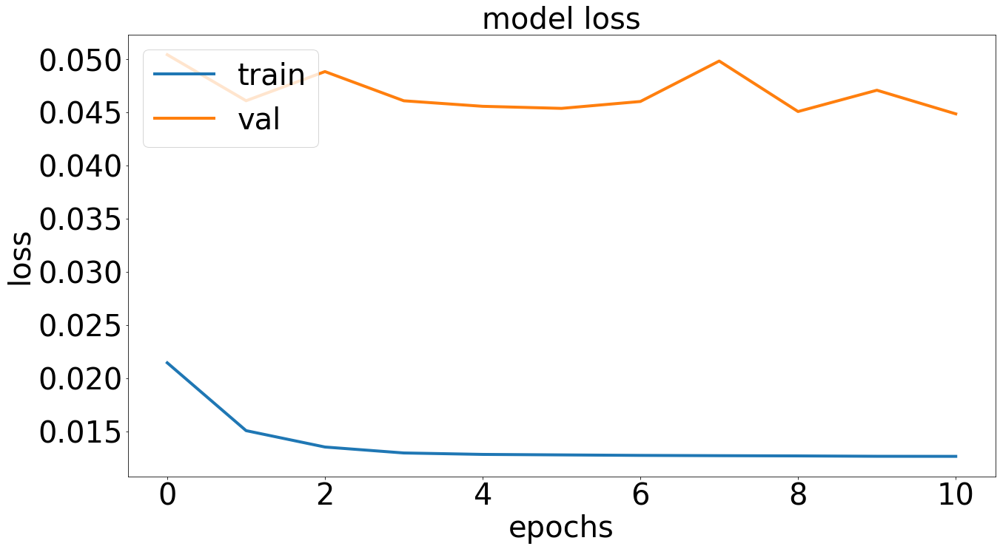

In [3]:
df_log = pd.read_csv('esnet/DCRNN_change_adj/training_log.csv')
plt.figure(figsize=(21, 11))
plt.plot(df_log['train_mae'], linewidth=4)
plt.plot(df_log['val_mae'], linewidth=4)
plt.title('model loss', fontsize=40)
plt.yticks(fontsize=40)
plt.xticks(fontsize=40)
plt.ylabel('loss', fontsize=40)
plt.xlabel('epochs', fontsize=40)
plt.legend(['train', 'val'], loc='upper left', fontsize=40)
plt.show()

# Dynamic and Static DCRNN comparison 

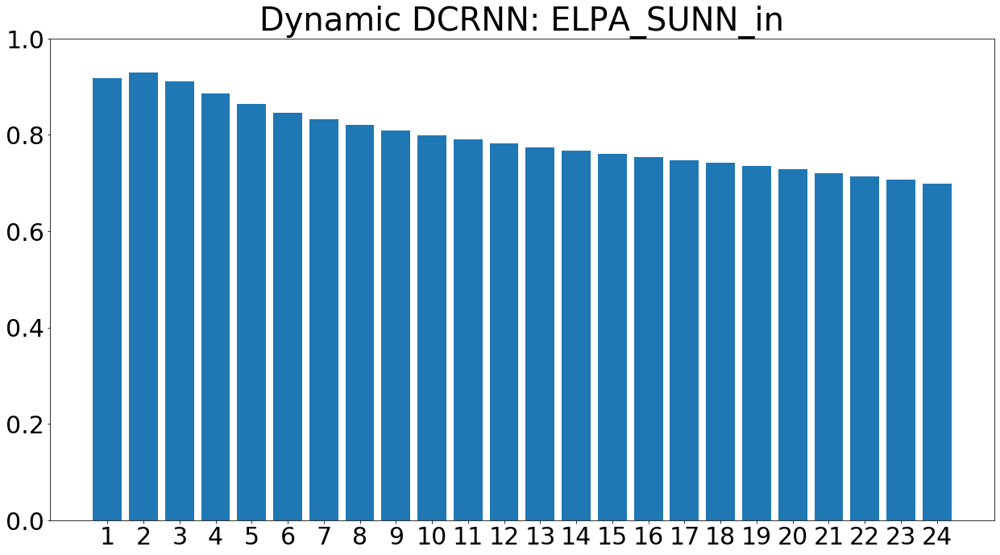

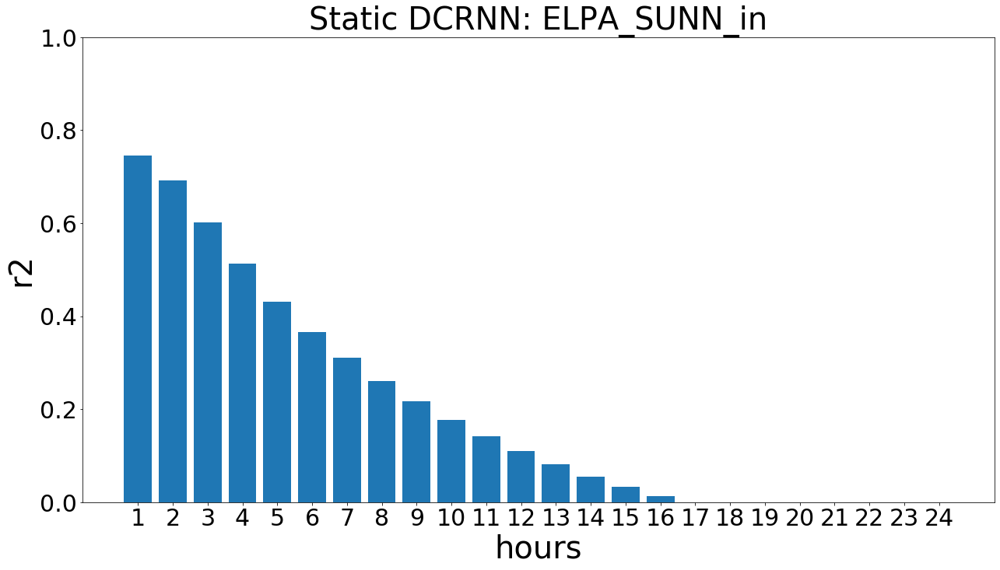

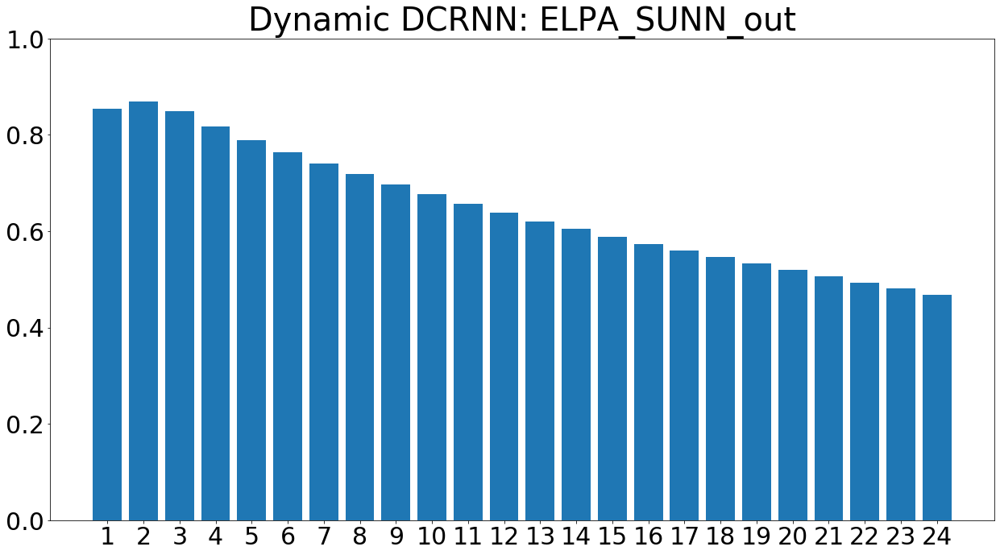

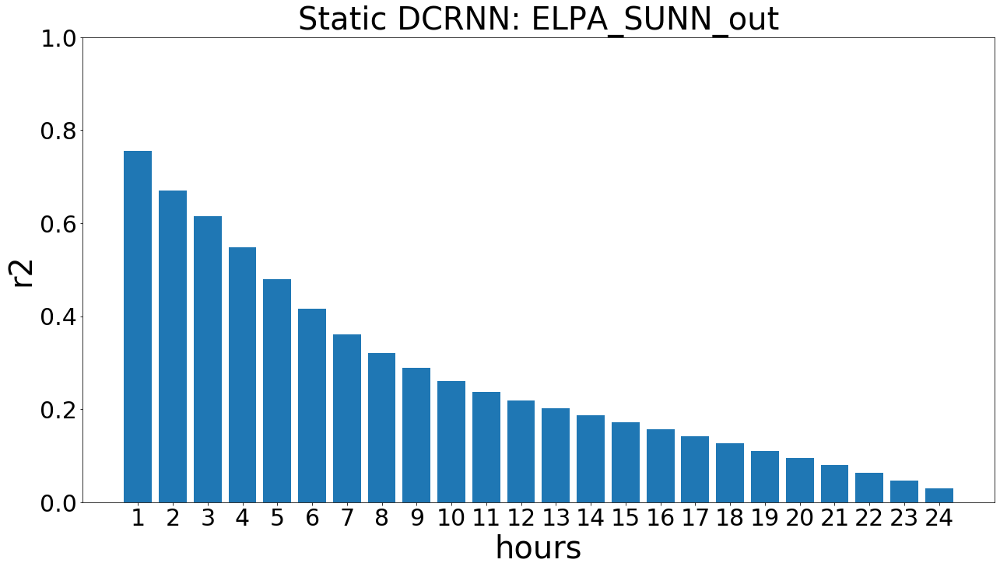

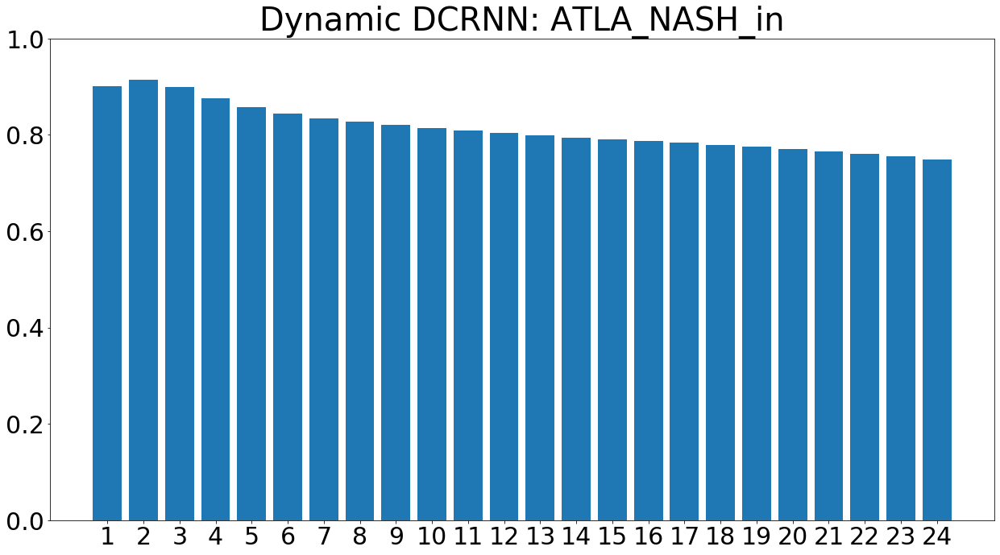

...

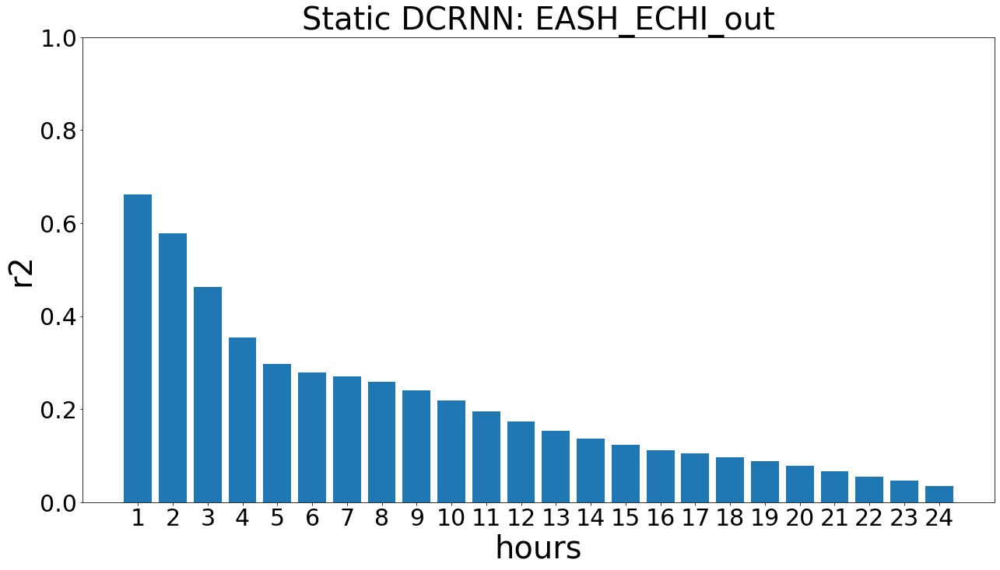

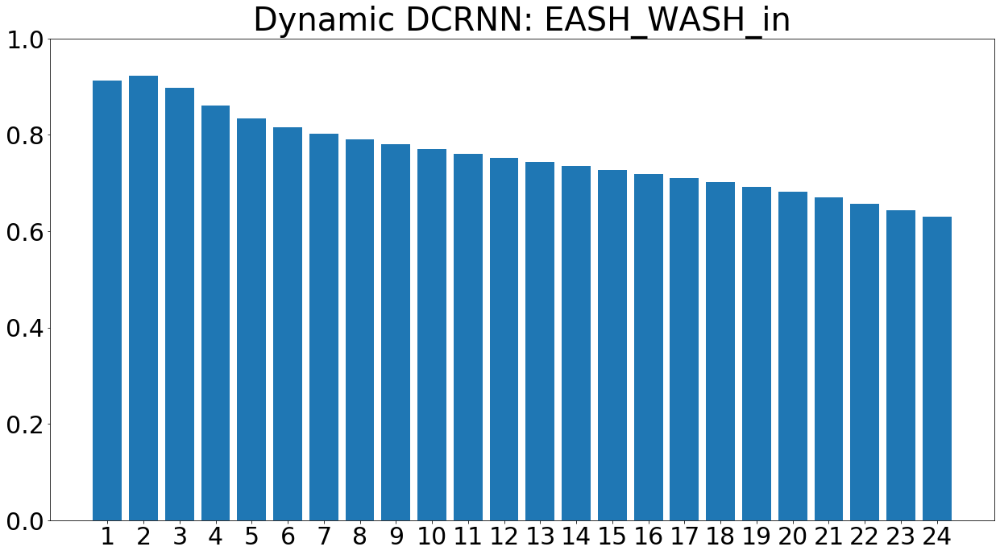

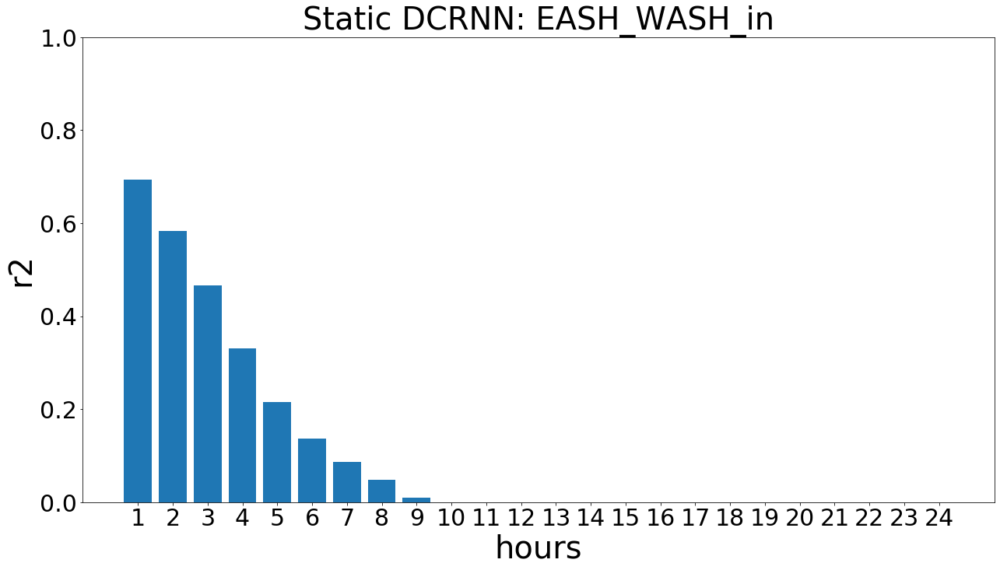

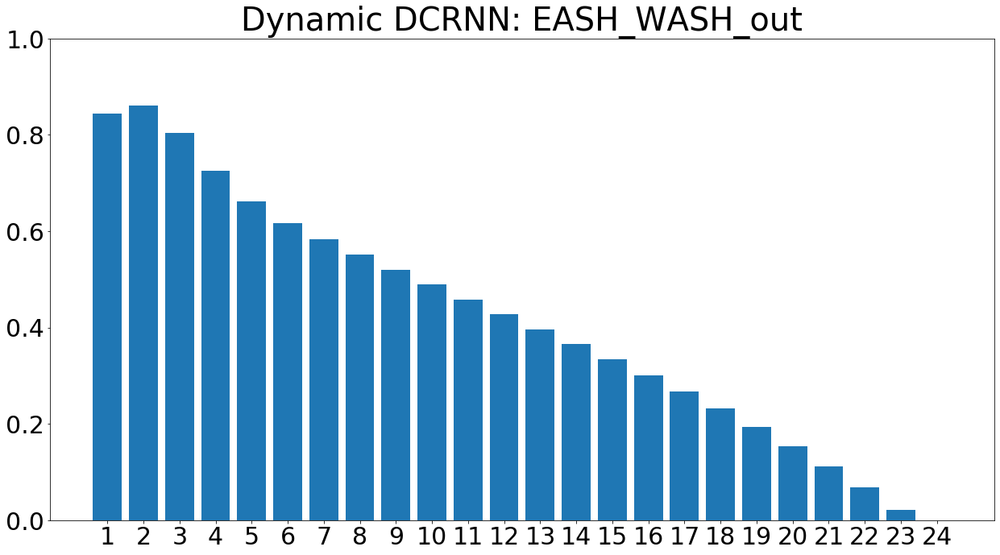

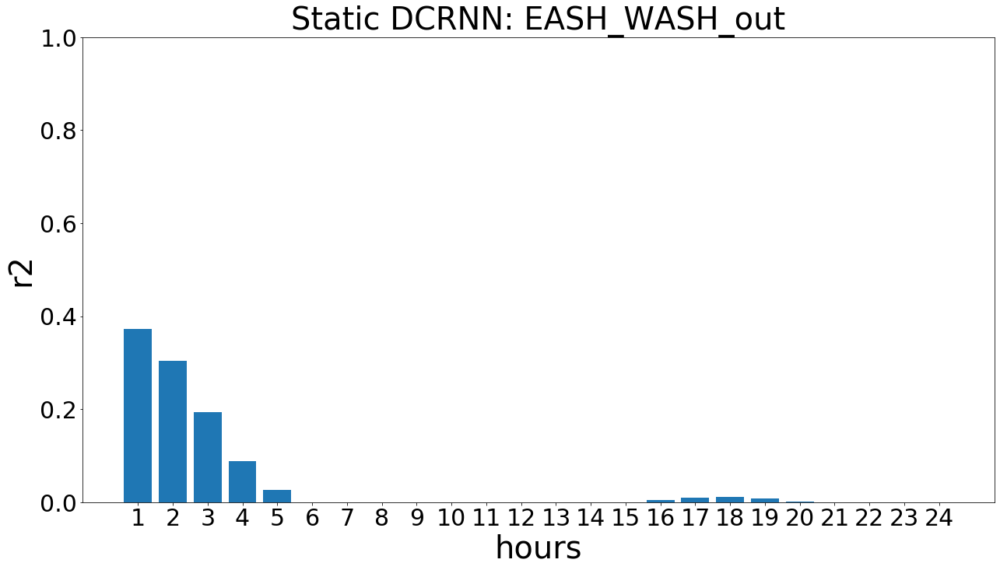

In [26]:
sites =  ['ELPA_SUNN_in','ELPA_SUNN_out','ATLA_NASH_in','ATLA_NASH_out','CHIC_ECHI_in','CHIC_ECHI_out',
               'HOUS_NASH_out','ELPA_HOUS_in','EASH_ECHI_in','EASH_ECHI_out',
               'EASH_WASH_in','EASH_WASH_out']

df_full = pd.read_csv('Results/Results_DCRNN/R2_DCRNN.csv')
df_cluster = pd.read_csv('Results/Results_DCRNN_cluster/R2_DCRNN.csv')
df_DDCRNN_cluster = pd.read_csv('Results/Results_DDCRNN_24_24/R2_DCRNN.csv')
df_full = df_full.set_index('sites')
df_cluster = df_cluster.set_index('sites')
df_DDCRNN_cluster = df_DDCRNN_cluster.set_index('sites')

for site in sites:
    site_full = df_full.loc[site]
    site_cluster = df_cluster.loc[site]
    site_DDCRNN_cluster = df_DDCRNN_cluster.loc[site]
    langs = list(map(str, list(range(1,25))))
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_DDCRNN_cluster)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('Dynamic DCRNN: ' + site, fontsize=40)
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_cluster)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('Static DCRNN: ' + site, fontsize=40)
    
    #fig = plt.figure(figsize=(21, 11))
    #plt.bar(langs,site_full)
    #plt.yticks(fontsize=30)
    #plt.xticks(fontsize=30)
    #plt.ylim([0, 1])
    #plt.title('Full network: ' + site, fontsize=40)
    
    plt.ylabel('r2', fontsize=40)
    plt.xlabel('hours', fontsize=40)
    plt.ylim([0, 1])
    plt.show()
    
    

# ARIMA

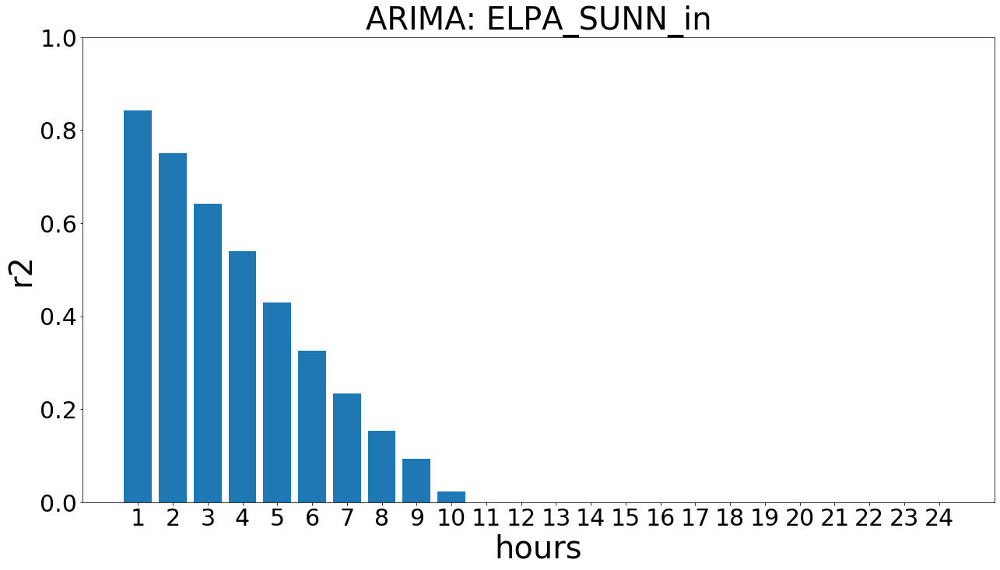

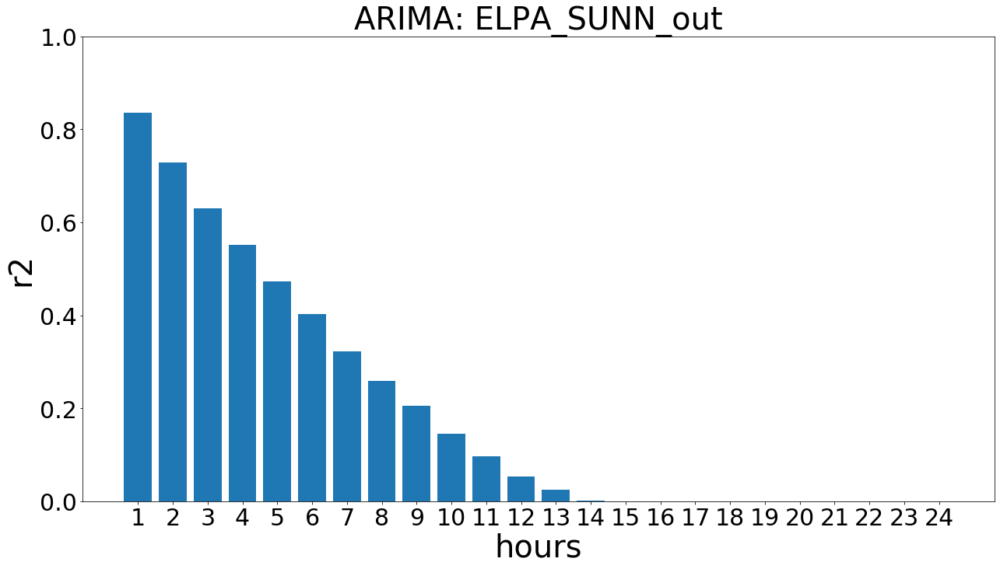

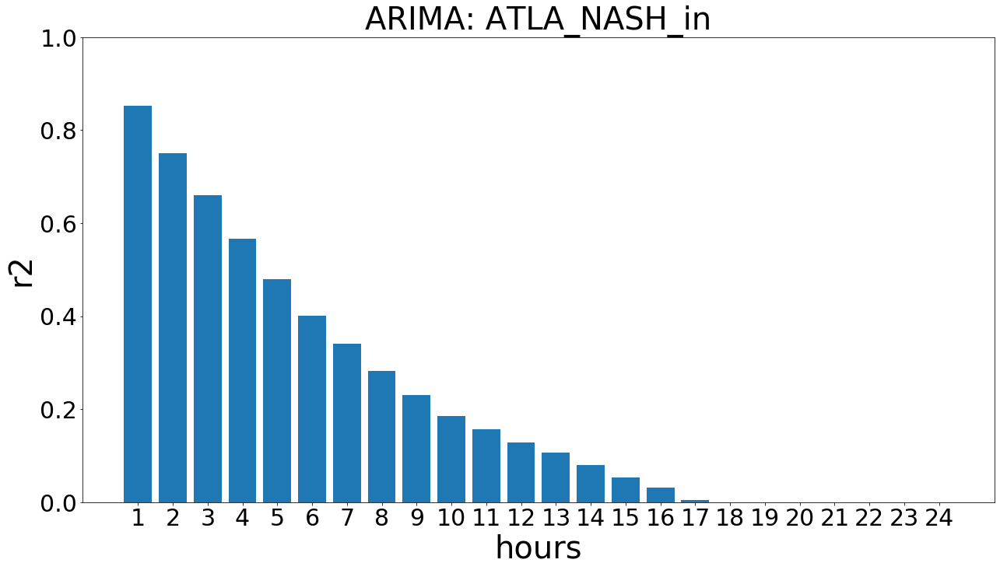

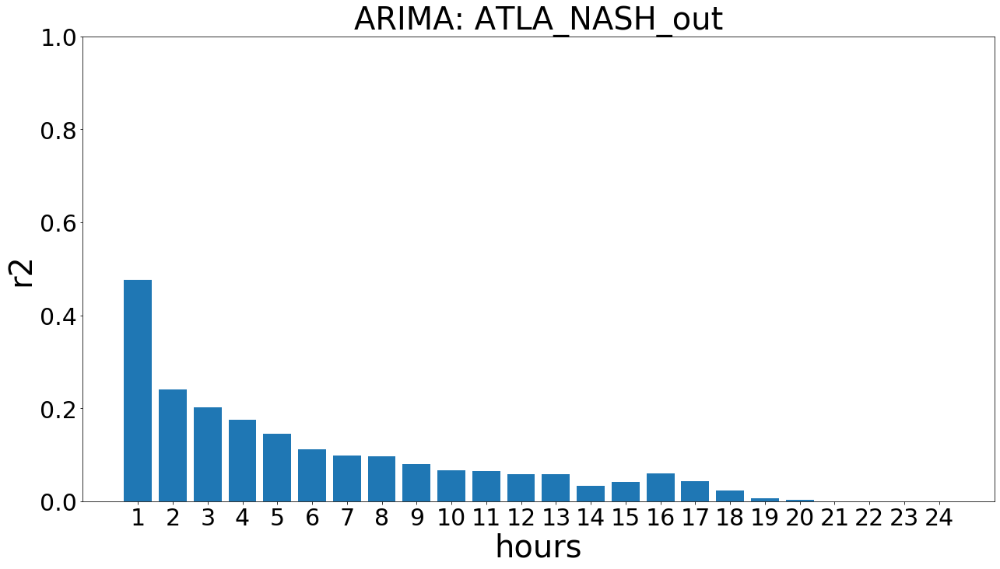

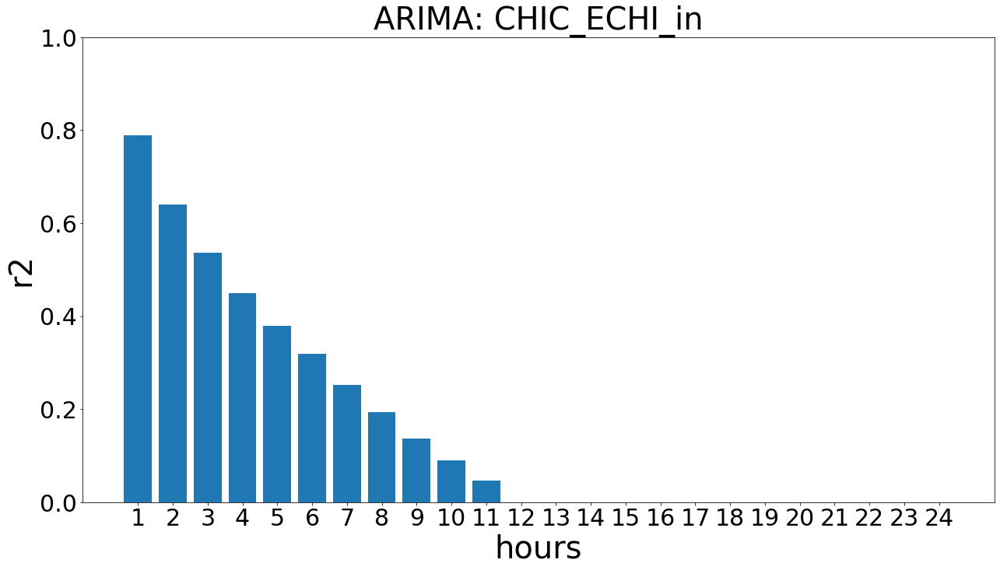

...

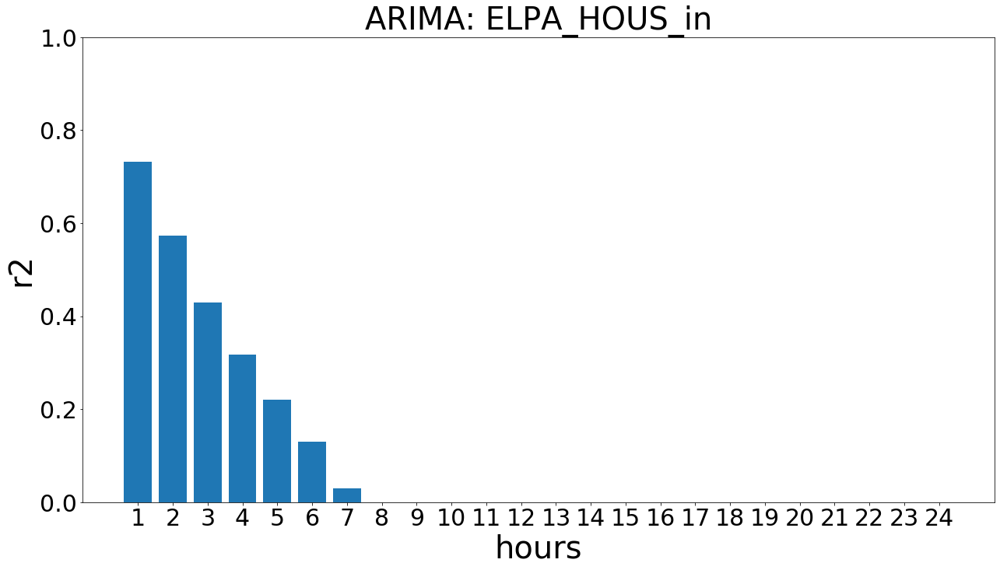

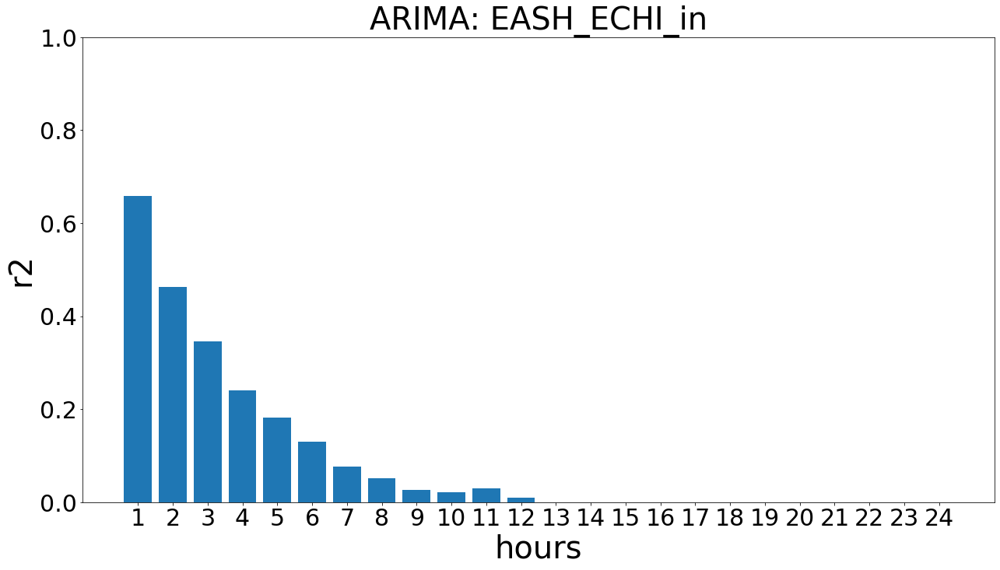

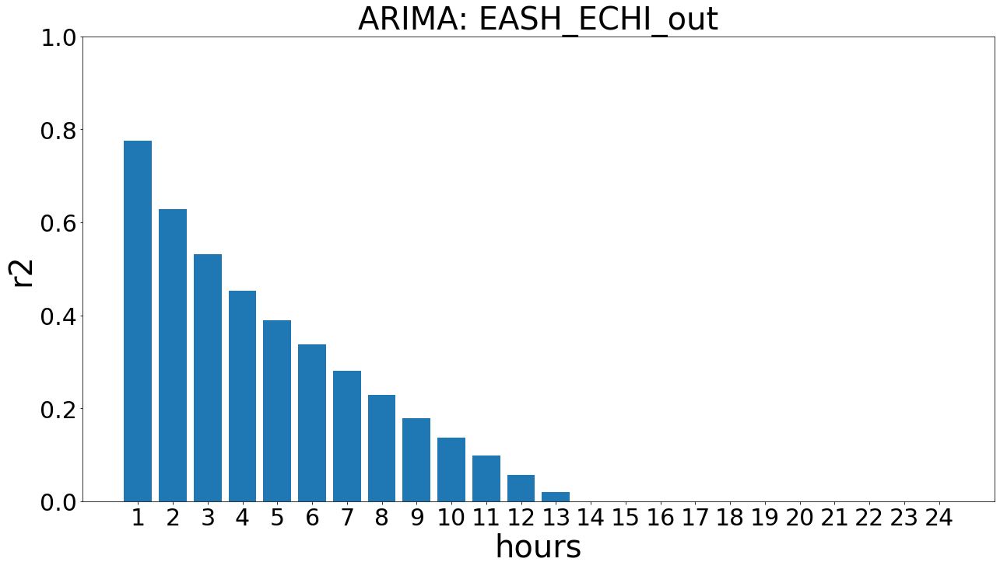

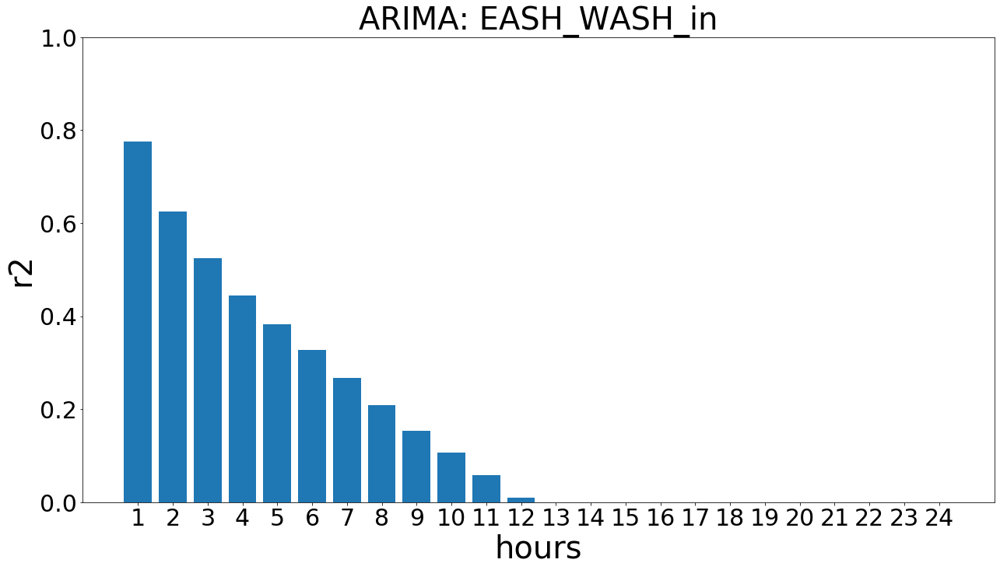

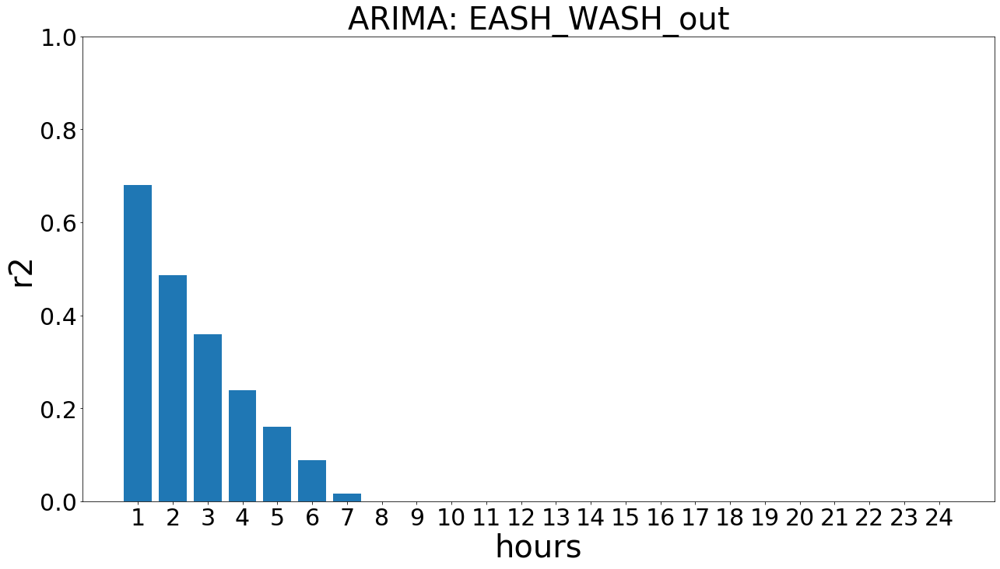

In [5]:
sites =  ['ELPA_SUNN_in','ELPA_SUNN_out','ATLA_NASH_in','ATLA_NASH_out','CHIC_ECHI_in','CHIC_ECHI_out',
               'HOUS_NASH_out','ELPA_HOUS_in','EASH_ECHI_in','EASH_ECHI_out',
               'EASH_WASH_in','EASH_WASH_out']

df_full = pd.read_csv('R2_all/r2/R2_ARIMA.csv')
#df_cluster = pd.read_csv('Results/Results_DCRNN_cluster/R2_DCRNN.csv')
df_full = df_full.set_index('sites')
#df_cluster = df_cluster.set_index('sites')

for site in sites:
    site_full = df_full.loc[site]
    langs = list(map(str, list(range(1,25))))
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_full)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.title('ARIMA: ' + site, fontsize=40)
        
    plt.ylabel('r2', fontsize=40)
    plt.xlabel('hours', fontsize=40)
    plt.ylim([0, 1])
    plt.show()
    
    

# 24 hours prediction vs bootstrapping using Dynamic DCRNN (DDCRNN)

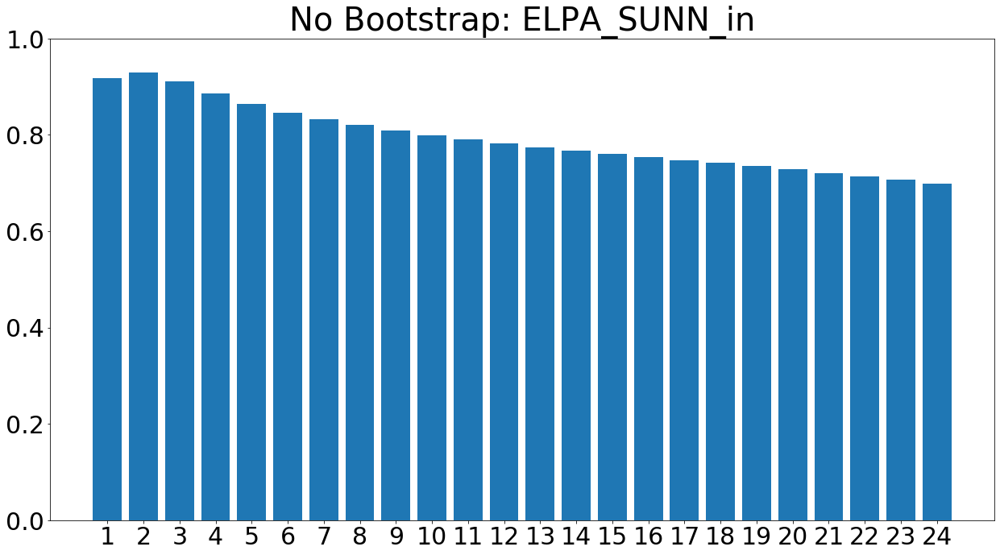

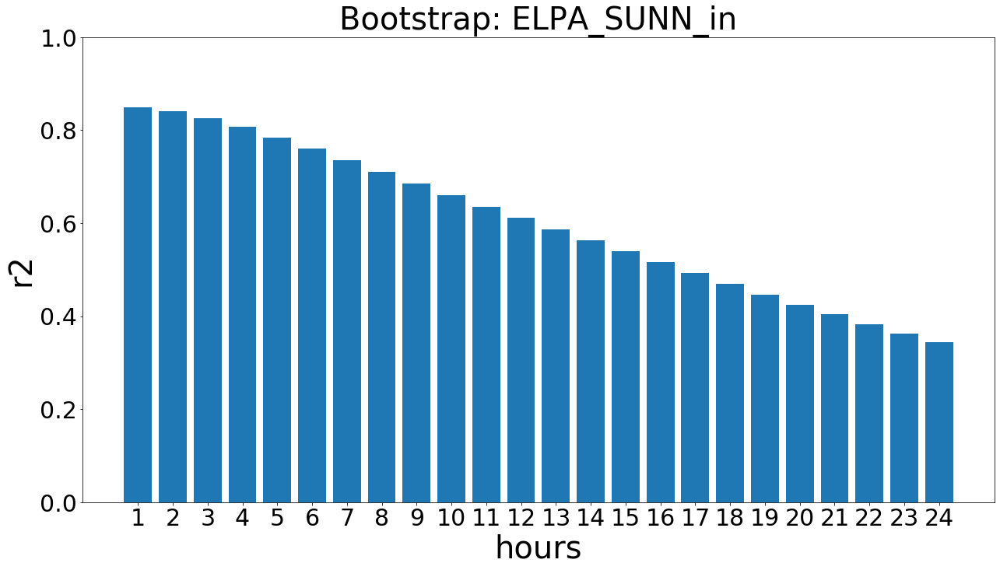

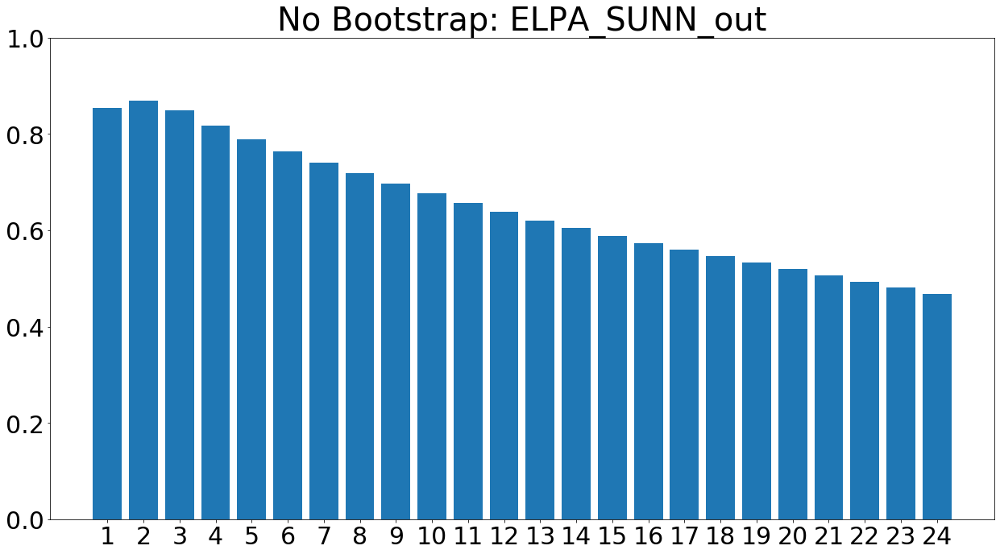

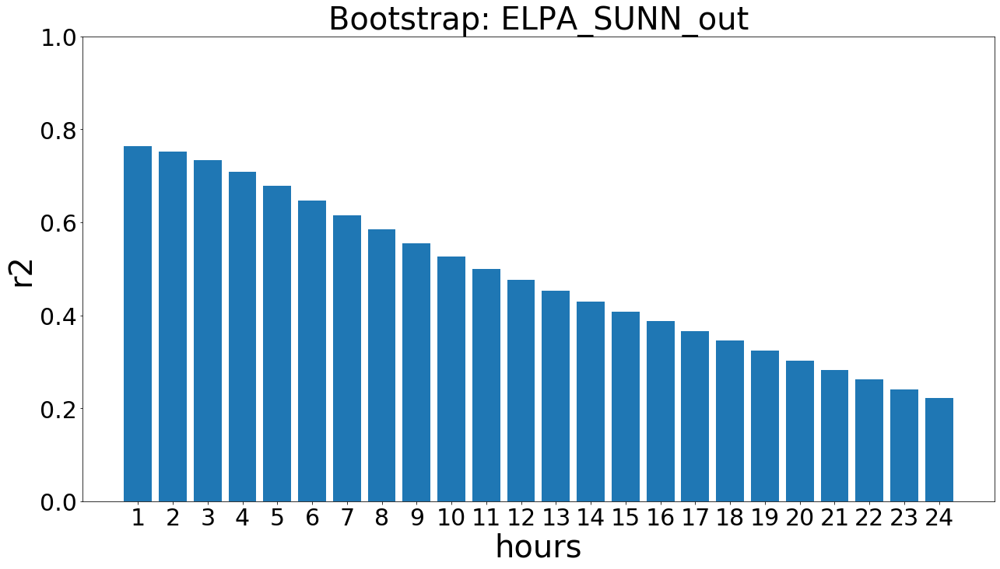

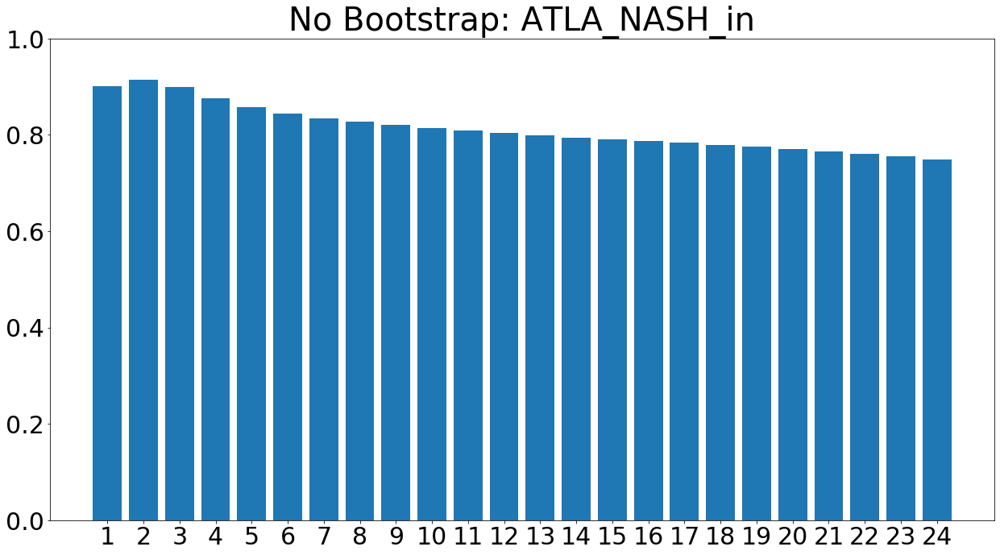

...

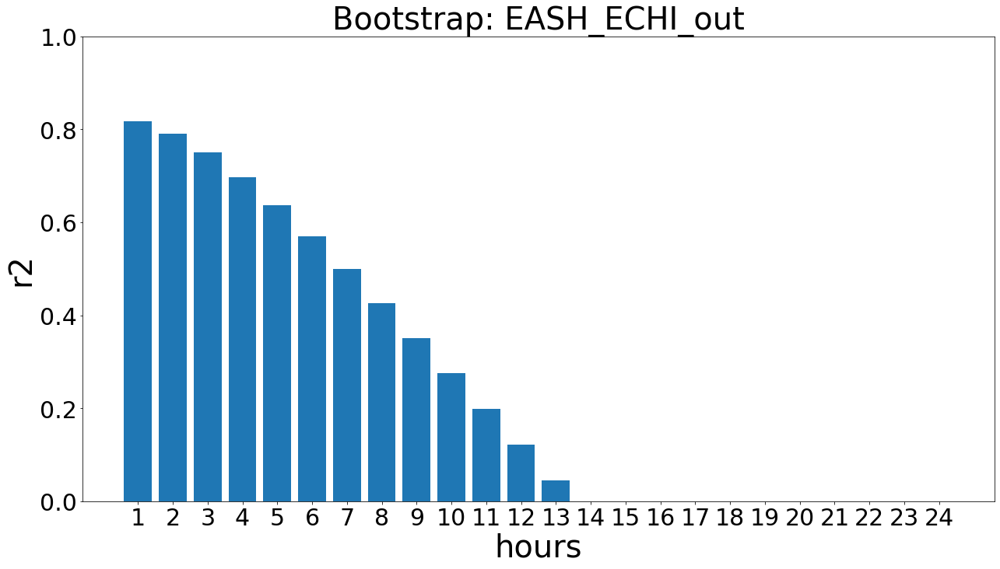

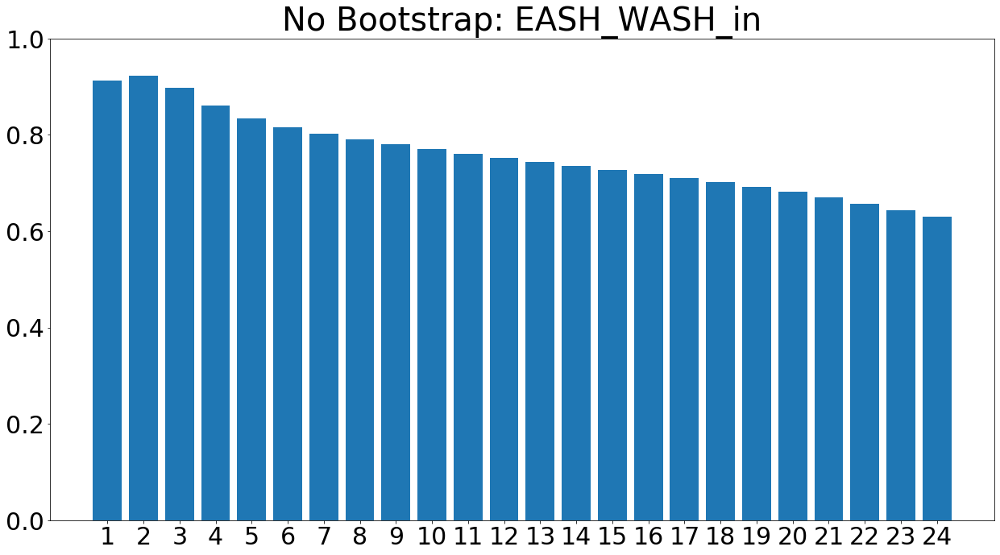

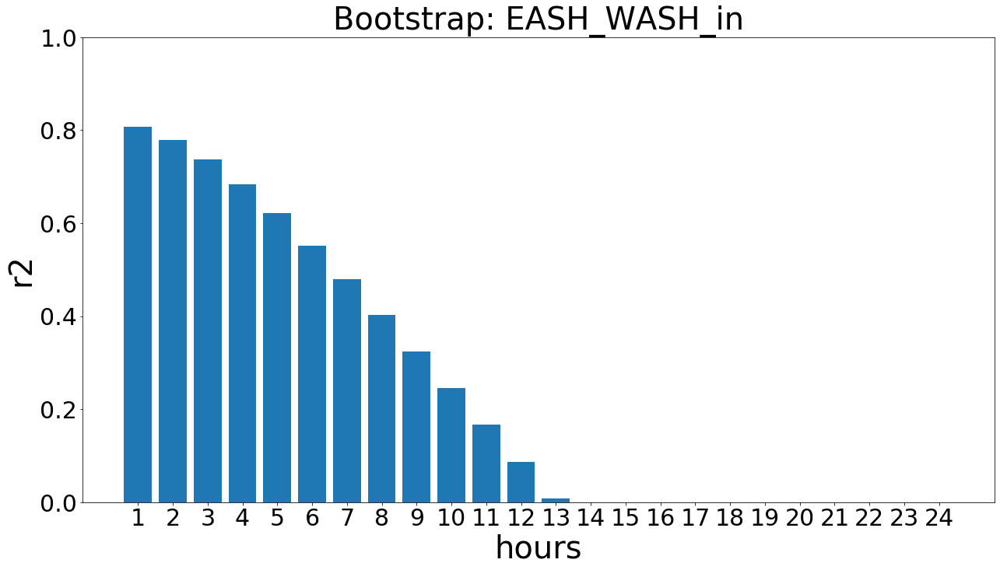

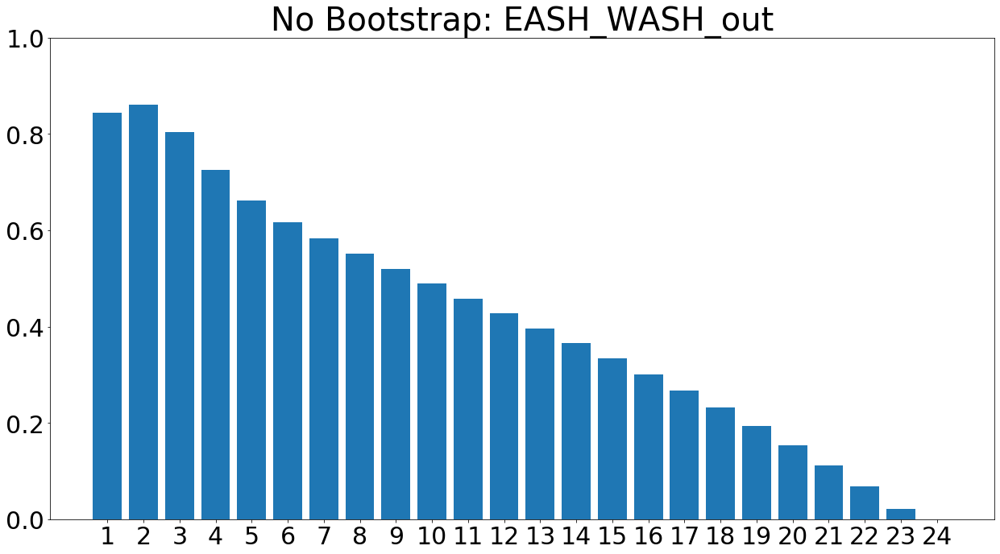

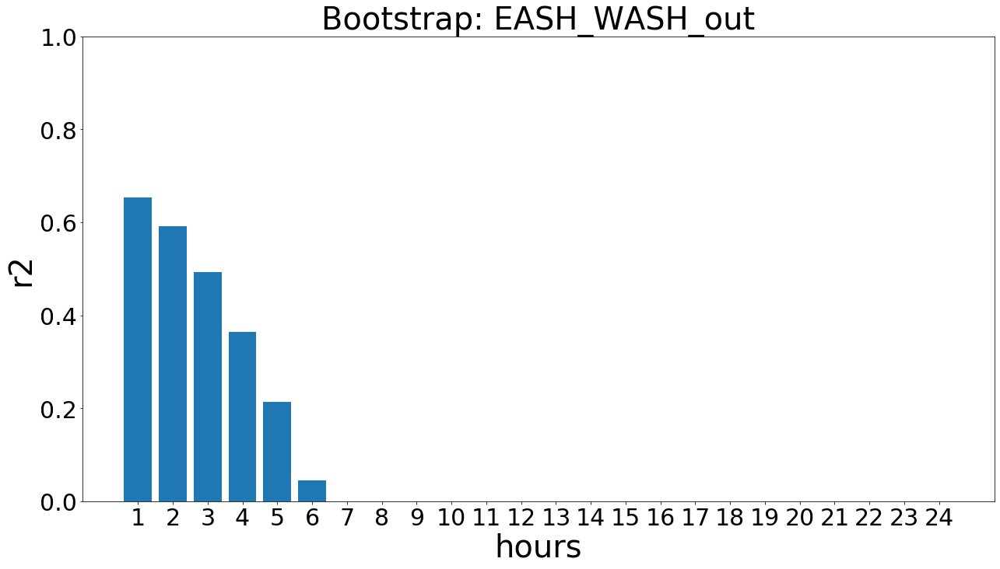

In [27]:
sites =  ['ELPA_SUNN_in','ELPA_SUNN_out','ATLA_NASH_in','ATLA_NASH_out','CHIC_ECHI_in','CHIC_ECHI_out',
               'HOUS_NASH_out','ELPA_HOUS_in','EASH_ECHI_in','EASH_ECHI_out',
               'EASH_WASH_in','EASH_WASH_out']

df_DDCRNN = pd.read_csv('Results/Results_DDCRNN_24_24/R2_DCRNN.csv')
df_boot = pd.read_csv('Results/Results_DDCRNN_bootstrap/R2_DCRNN.csv')

df_DDCRNN = df_DDCRNN.set_index('sites')
df_boot = df_boot.set_index('sites')

for site in sites:
    site_DDCRNN = df_DDCRNN.loc[site]
    site_boot = df_boot.loc[site]
    langs = list(map(str, list(range(1,25))))
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_DDCRNN)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('No Bootstrap: ' + site, fontsize=40)
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_boot)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('Bootstrap: ' + site, fontsize=40)
    
    plt.ylabel('r2', fontsize=40)
    plt.xlabel('hours', fontsize=40)
    plt.ylim([0, 1])
    plt.show()
    
    

# 6 --> 6, 12 --> 12, 18 --> 18

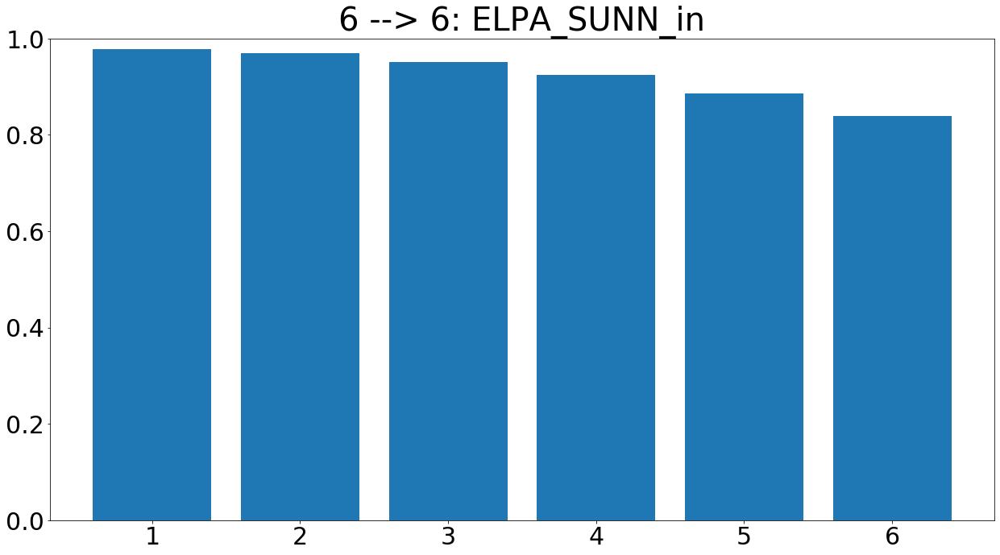

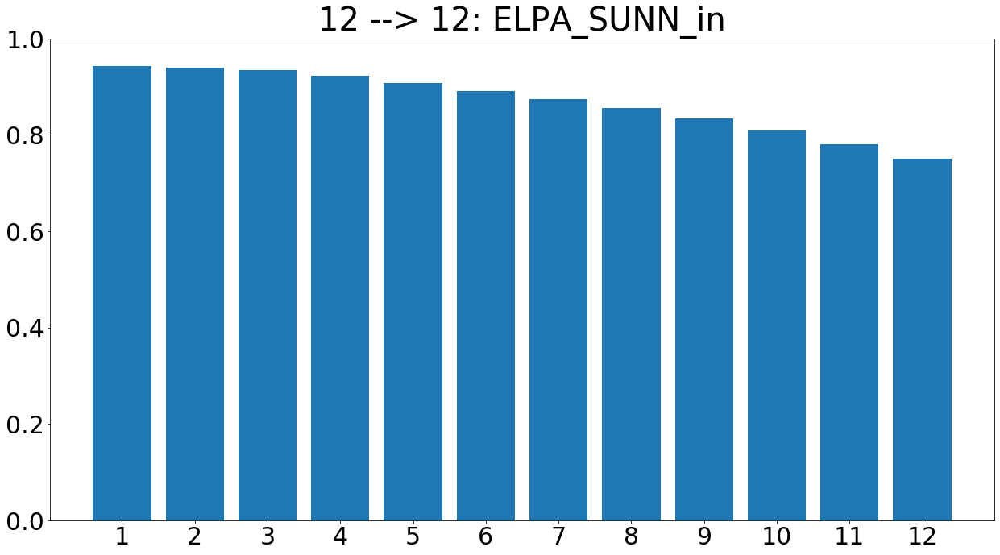

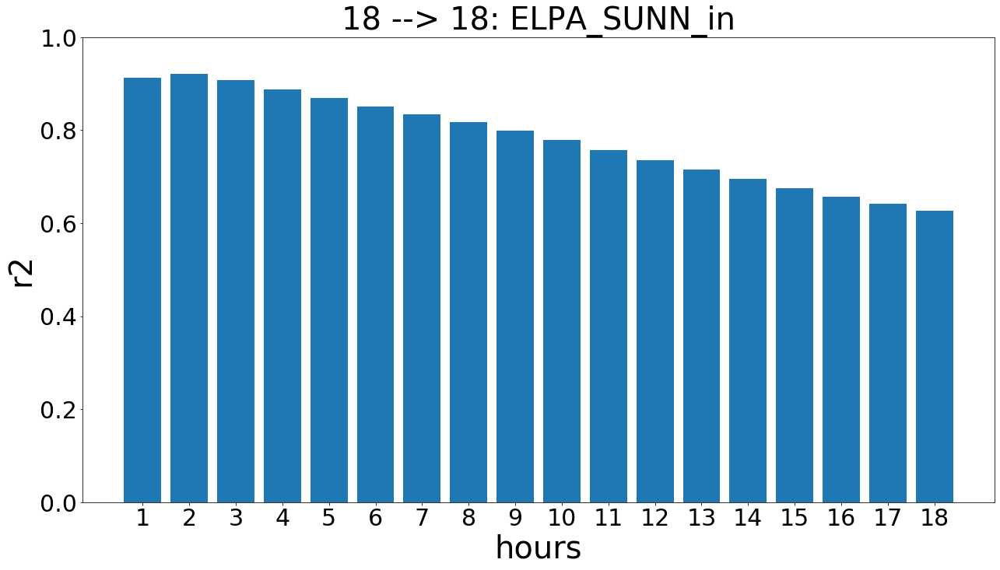

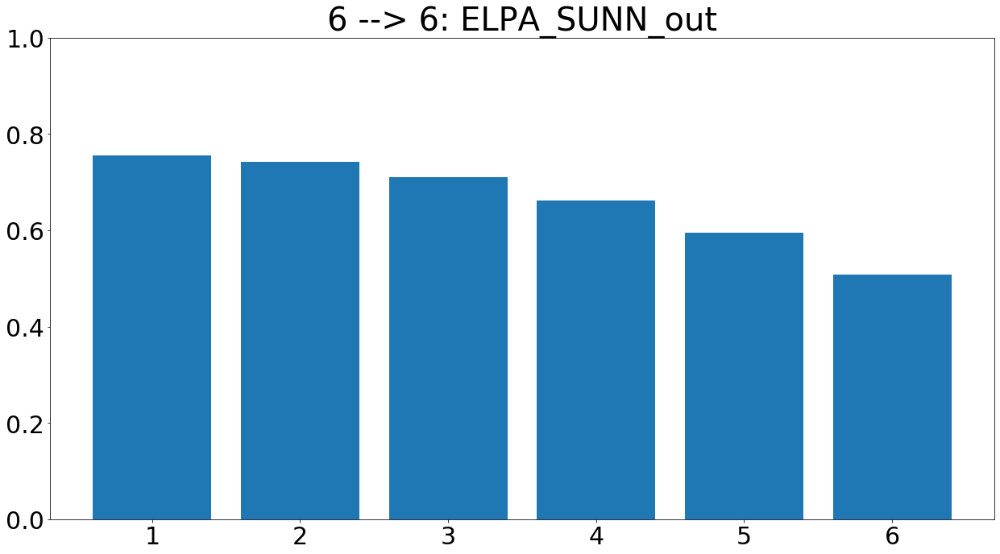

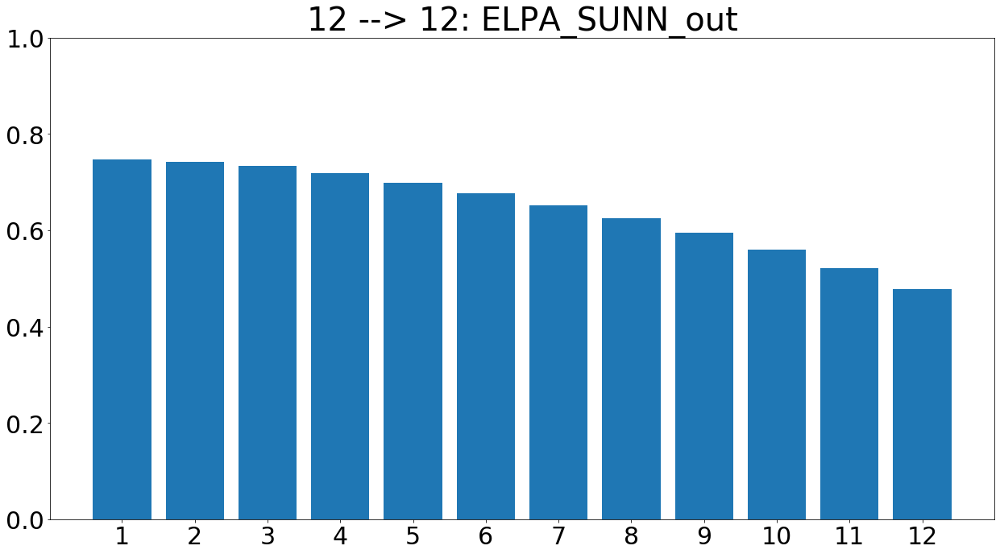

...

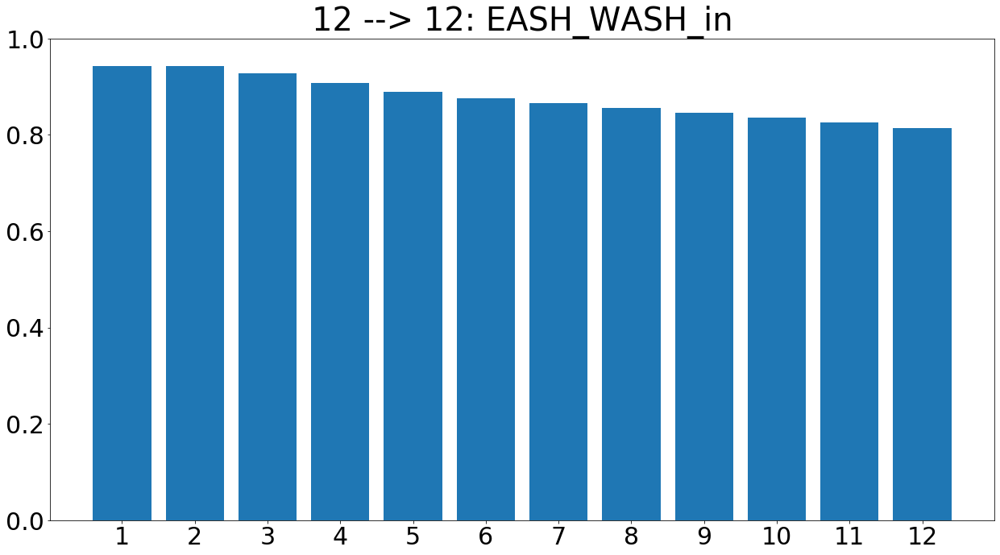

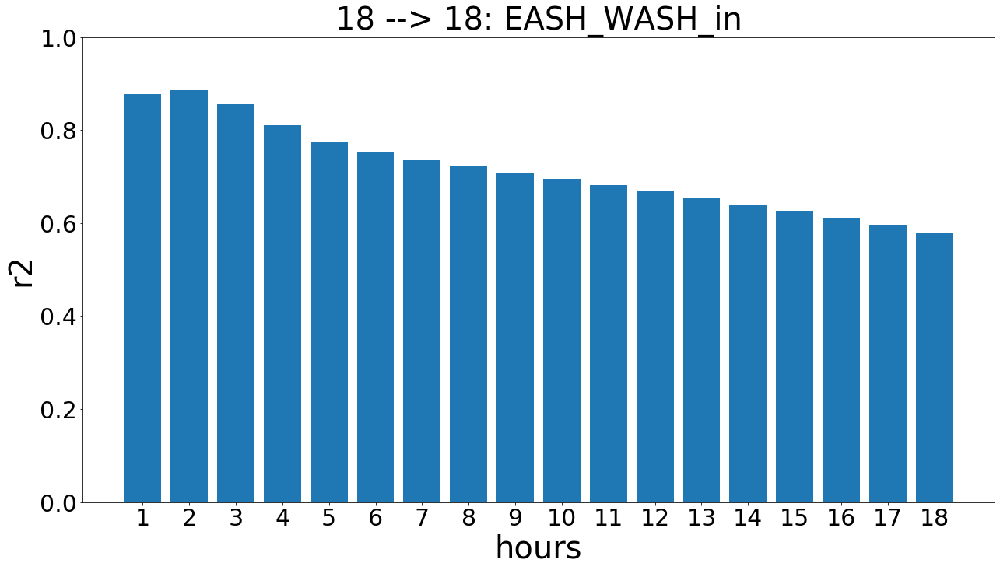

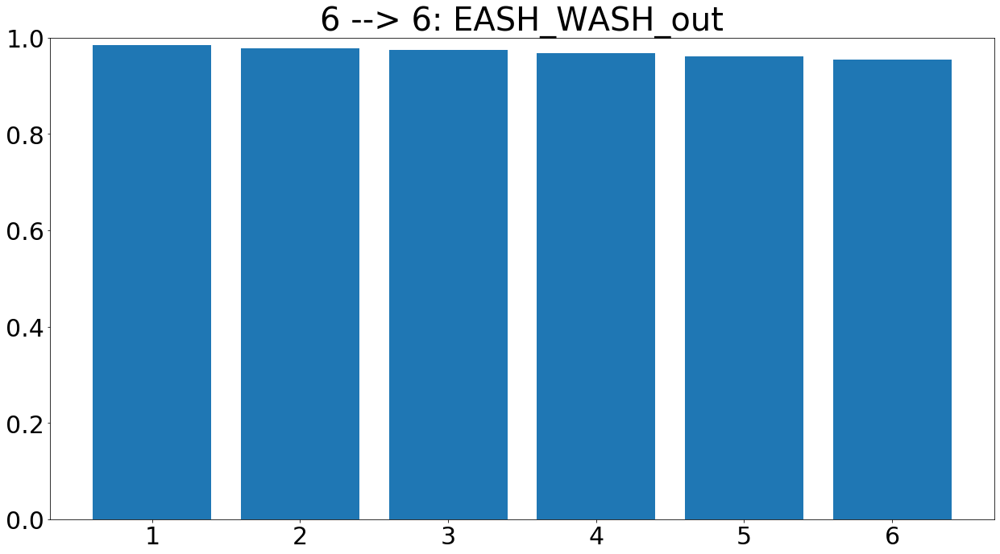

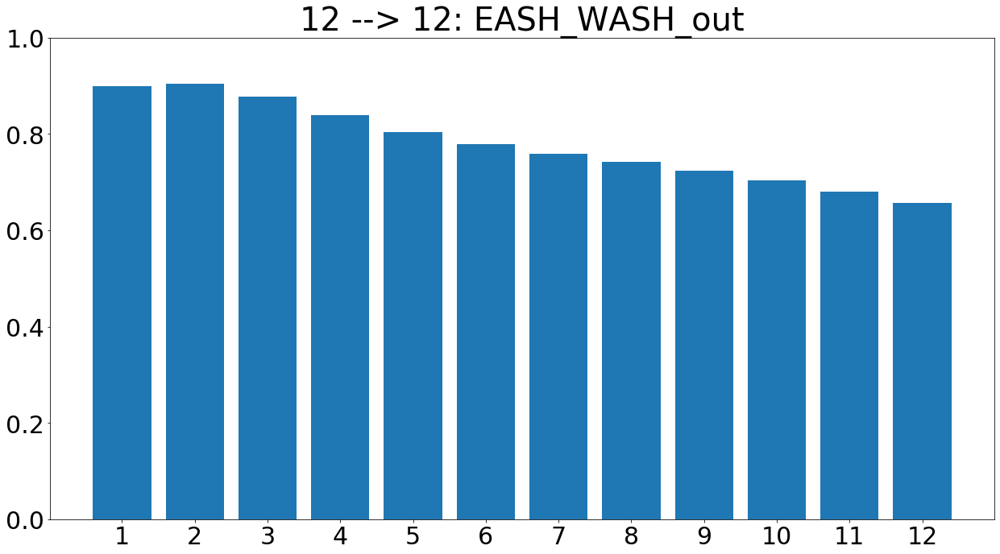

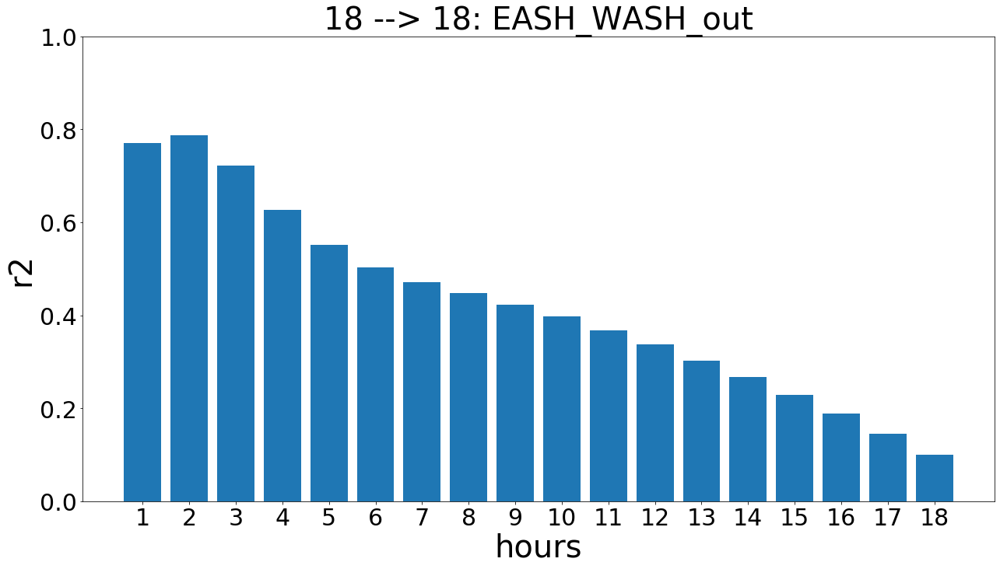

In [14]:
hor = 6
df_DDCRNN_6 = pd.read_csv('Results/Results_DDCRNN_6_6/R2_DCRNN.csv')
df_DDCRNN_12 = pd.read_csv('Results/Results_DDCRNN_12_12/R2_DCRNN.csv')
df_DDCRNN_18 = pd.read_csv('Results/Results_DDCRNN_18_18/R2_DCRNN.csv')
df_DDCRNN_6 = df_DDCRNN_6.set_index('sites')
df_DDCRNN_12 = df_DDCRNN_12.set_index('sites')
df_DDCRNN_18 = df_DDCRNN_18.set_index('sites')

for site in sites:
    site_DDCRNN_6 = df_DDCRNN_6.loc[site]
    site_DDCRNN_12 = df_DDCRNN_12.loc[site]
    site_DDCRNN_18 = df_DDCRNN_18.loc[site]
    
    langs1 = list(map(str, list(range(1,hor+1))))
    langs2 = list(map(str, list(range(1,(hor*2)+1))))
    langs3 = list(map(str, list(range(1,(hor*3)+1))))
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs1,site_DDCRNN_6)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('6 --> 6: ' + site, fontsize=40)
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs2,site_DDCRNN_12)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('12 --> 12: ' + site, fontsize=40)
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs3,site_DDCRNN_18)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('18 --> 18: ' + site, fontsize=40)
    
    plt.ylabel('r2', fontsize=40)
    plt.xlabel('hours', fontsize=40)
    plt.ylim([0, 1])
    plt.show()

In [ ]:
fig = plt.figure(figsize=(21, 11))
plt.bar(langs,site_DDCRNN_6)
plt.yticks(fontsize=30)
plt.xticks(fontsize=30)
plt.ylim([0, 1])
plt.title('6 --> 24: ' + site, fontsize=40)

fig = plt.figure(figsize=(21, 11))
plt.bar(langs,site_DDCRNN_12)
plt.yticks(fontsize=30)
plt.xticks(fontsize=30)
plt.ylim([0, 1])
plt.title('12 --> 24: ' + site, fontsize=40)

fig = plt.figure(figsize=(21, 11))
plt.bar(langs,site_DDCRNN_18)
plt.yticks(fontsize=30)
plt.xticks(fontsize=30)
plt.ylim([0, 1])
plt.title('18 --> 24: ' + site, fontsize=40)

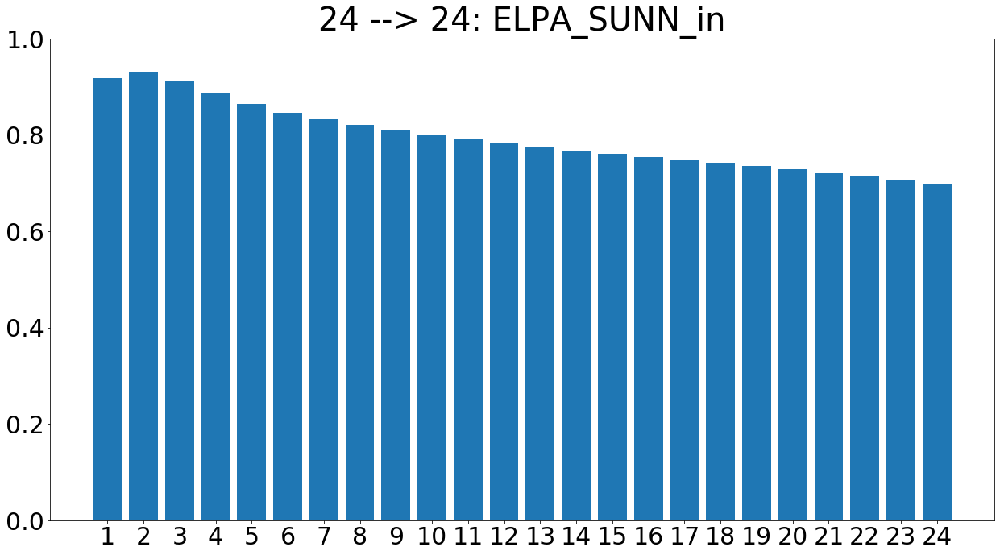

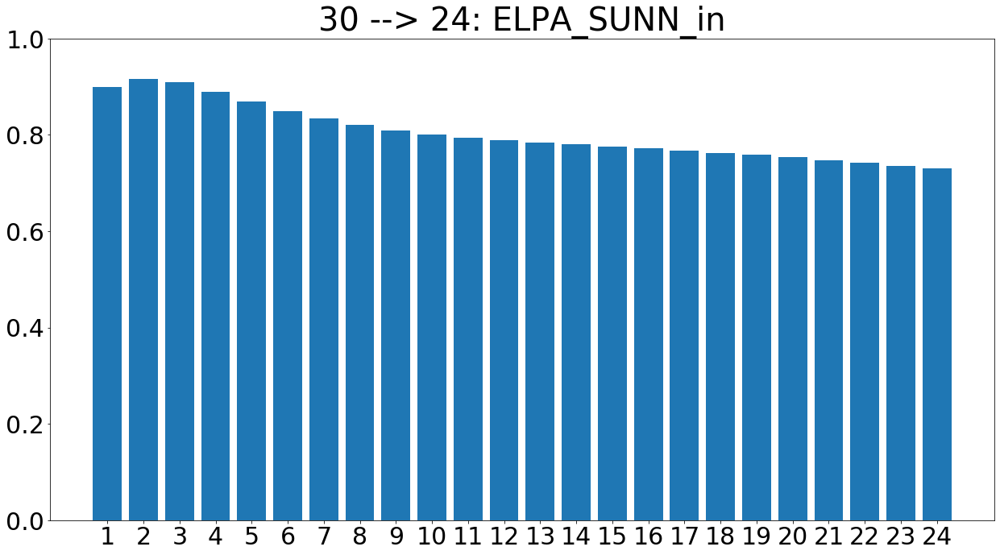

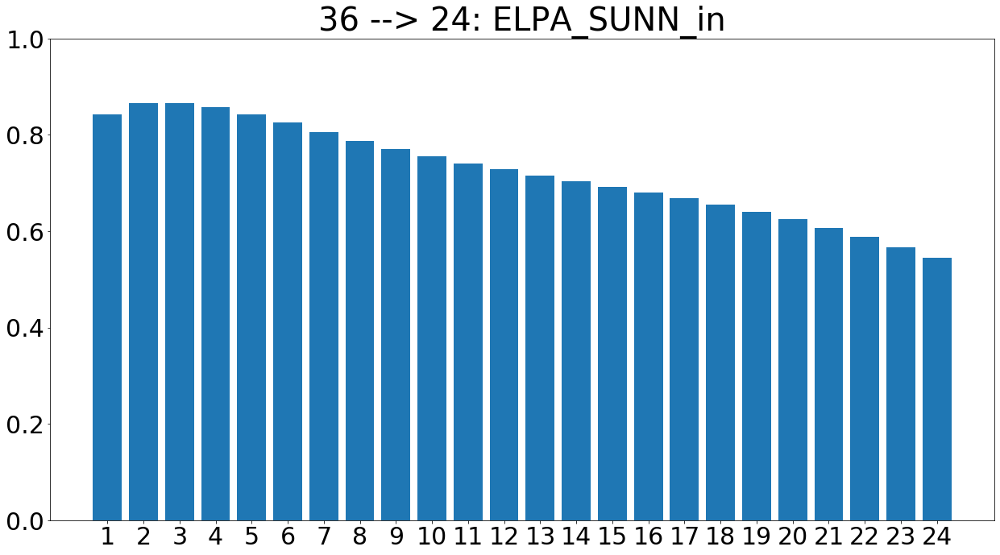

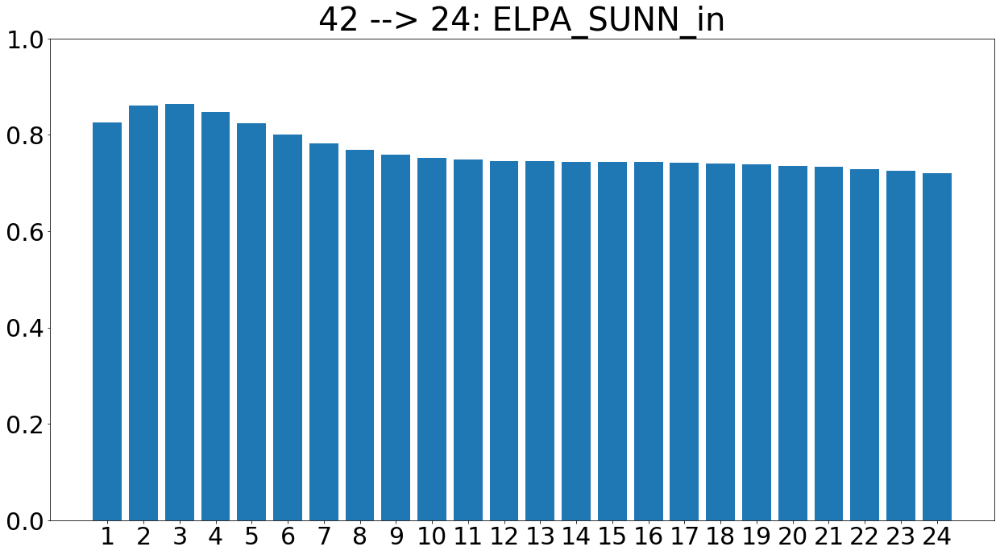

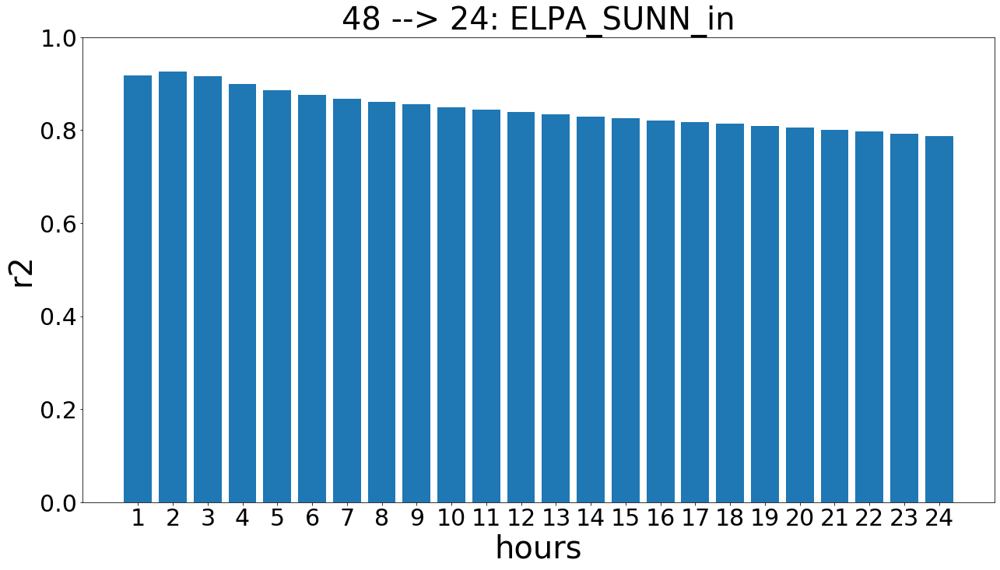

...

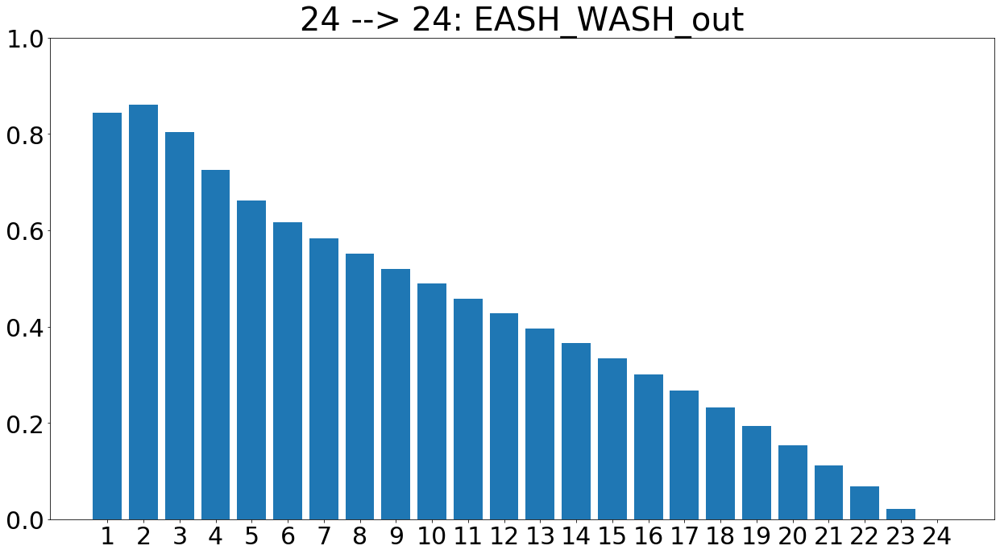

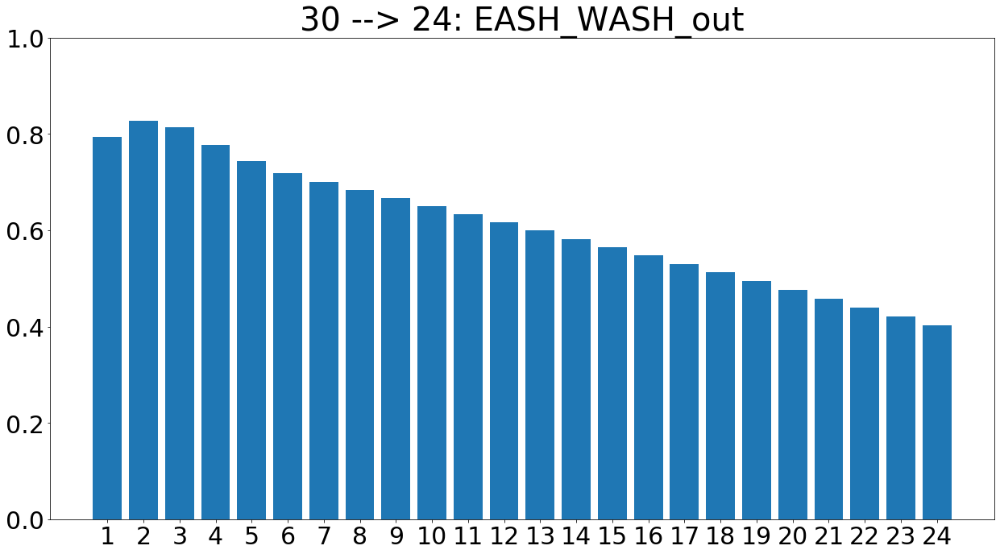

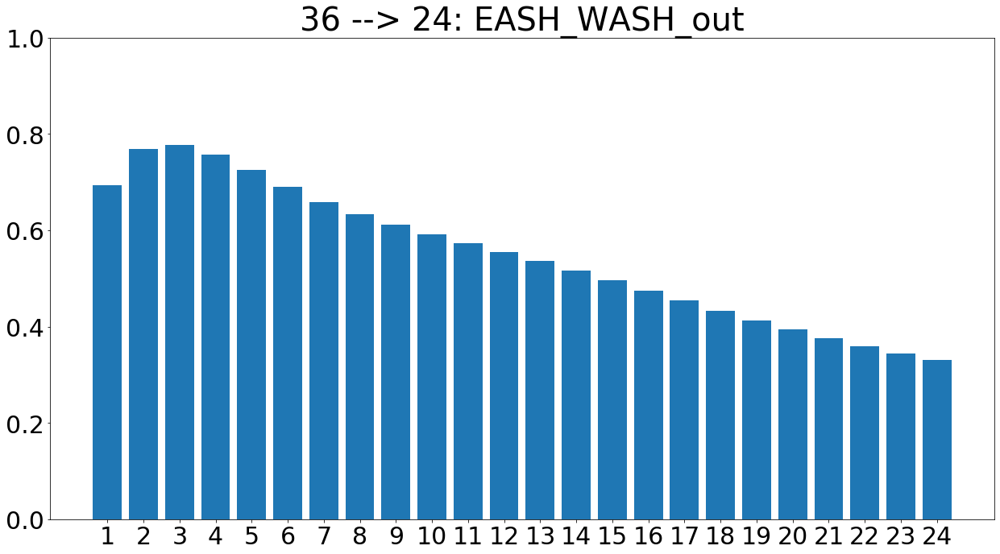

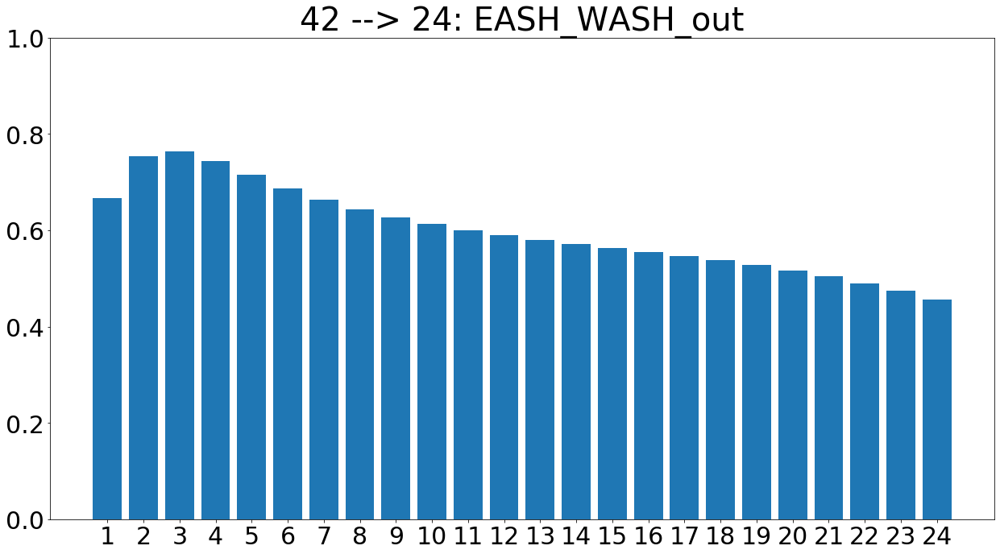

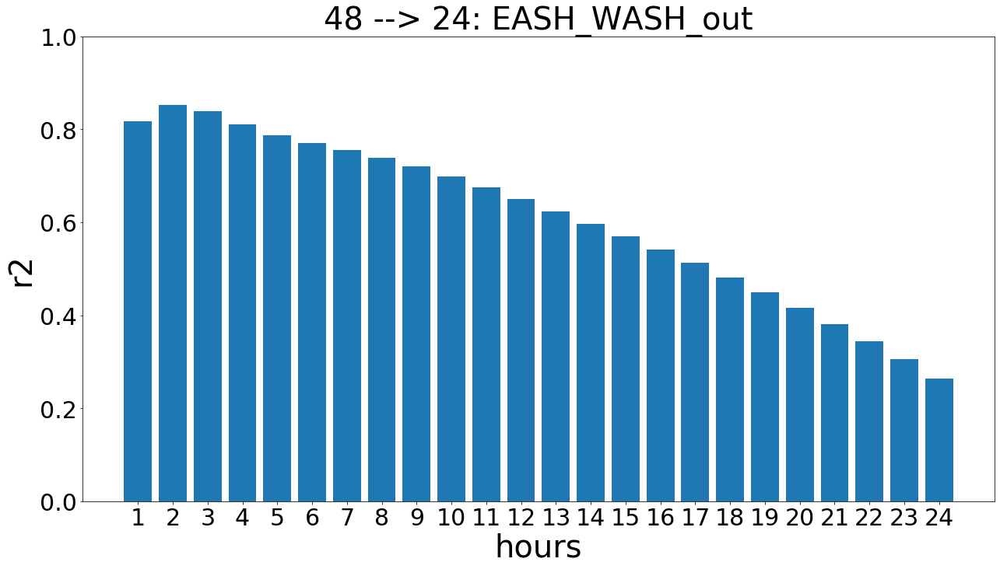

In [31]:
hor = 24
df_DDCRNN_6 = pd.read_csv('Results/Results_DDCRNN_6_24/R2_DCRNN.csv')
df_DDCRNN_12 = pd.read_csv('Results/Results_DDCRNN_12_24/R2_DCRNN.csv')
df_DDCRNN_18 = pd.read_csv('Results/Results_DDCRNN_18_24/R2_DCRNN.csv')
df_DDCRNN_24 = pd.read_csv('Results/Results_DDCRNN_24_24/R2_DCRNN.csv')
df_DDCRNN_30 = pd.read_csv('Results/Results_DDCRNN_30_24/R2_DCRNN.csv')
df_DDCRNN_36 = pd.read_csv('Results/Results_DDCRNN_36_24/R2_DCRNN.csv')
df_DDCRNN_42 = pd.read_csv('Results/Results_DDCRNN_42_24/R2_DCRNN.csv')
df_DDCRNN_48 = pd.read_csv('Results/Results_DDCRNN_48_24/R2_DCRNN.csv')
df_DDCRNN_6 = df_DDCRNN_6.set_index('sites')
df_DDCRNN_12 = df_DDCRNN_12.set_index('sites')
df_DDCRNN_18 = df_DDCRNN_18.set_index('sites')
df_DDCRNN_24 = df_DDCRNN_24.set_index('sites')
df_DDCRNN_30 = df_DDCRNN_30.set_index('sites')
df_DDCRNN_36 = df_DDCRNN_36.set_index('sites')
df_DDCRNN_42 = df_DDCRNN_42.set_index('sites')
df_DDCRNN_48 = df_DDCRNN_48.set_index('sites')

for site in sites:
    site_DDCRNN_6 = df_DDCRNN_6.loc[site]
    site_DDCRNN_12 = df_DDCRNN_12.loc[site]
    site_DDCRNN_18 = df_DDCRNN_18.loc[site]
    site_DDCRNN_24 = df_DDCRNN_24.loc[site]
    site_DDCRNN_30 = df_DDCRNN_30.loc[site]
    site_DDCRNN_36 = df_DDCRNN_36.loc[site]
    site_DDCRNN_42 = df_DDCRNN_42.loc[site]
    site_DDCRNN_48 = df_DDCRNN_48.loc[site]
    
    langs = list(map(str, list(range(1,hor+1))))
    
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_DDCRNN_24)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('24 --> 24: ' + site, fontsize=40)
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_DDCRNN_30)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('30 --> 24: ' + site, fontsize=40)
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_DDCRNN_36)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('36 --> 24: ' + site, fontsize=40)
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_DDCRNN_42)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('42 --> 24: ' + site, fontsize=40)
    
    fig = plt.figure(figsize=(21, 11))
    plt.bar(langs,site_DDCRNN_48)
    plt.yticks(fontsize=30)
    plt.xticks(fontsize=30)
    plt.ylim([0, 1])
    plt.title('48 --> 24: ' + site, fontsize=40)
    
    plt.ylabel('r2', fontsize=40)
    plt.xlabel('hours', fontsize=40)
    plt.ylim([0, 1])
    plt.show()

In [ ]:
# Box plot

In [32]:
df_DDCRNN_6 = pd.read_csv('Results/Results_DDCRNN_6_24/R2_DCRNN.csv')
df_DDCRNN_12 = pd.read_csv('Results/Results_DDCRNN_12_24/R2_DCRNN.csv')
df_DDCRNN_18 = pd.read_csv('Results/Results_DDCRNN_18_24/R2_DCRNN.csv')
df_DDCRNN_24 = pd.read_csv('Results/Results_DDCRNN_24_24/R2_DCRNN.csv')
df_DDCRNN_30 = pd.read_csv('Results/Results_DDCRNN_30_24/R2_DCRNN.csv')
df_DDCRNN_36 = pd.read_csv('Results/Results_DDCRNN_36_24/R2_DCRNN.csv')
df_DDCRNN_42 = pd.read_csv('Results/Results_DDCRNN_42_24/R2_DCRNN.csv')
df_DDCRNN_48 = pd.read_csv('Results/Results_DDCRNN_48_24/R2_DCRNN.csv')
df_DDCRNN_6 = df_DDCRNN_6.set_index('sites')
df_DDCRNN_12 = df_DDCRNN_12.set_index('sites')
df_DDCRNN_18 = df_DDCRNN_18.set_index('sites')
df_DDCRNN_24 = df_DDCRNN_24.set_index('sites')
df_DDCRNN_30 = df_DDCRNN_30.set_index('sites')
df_DDCRNN_36 = df_DDCRNN_36.set_index('sites')
df_DDCRNN_42 = df_DDCRNN_42.set_index('sites')
df_DDCRNN_48 = df_DDCRNN_48.set_index('sites')

In [39]:
df_new = pd.DataFrame()
df_new['6'] = df_DDCRNN_6.values.flatten()
df_new['12'] = df_DDCRNN_12.values.flatten()
df_new['18'] = df_DDCRNN_18.values.flatten()
df_new['24'] = df_DDCRNN_24.values.flatten()
df_new['30'] = df_DDCRNN_30.values.flatten()
df_new['36'] = df_DDCRNN_36.values.flatten()
df_new['42'] = df_DDCRNN_42.values.flatten()
df_new['48'] = df_DDCRNN_48.values.flatten()

Text(0, 0.5, 'R2')

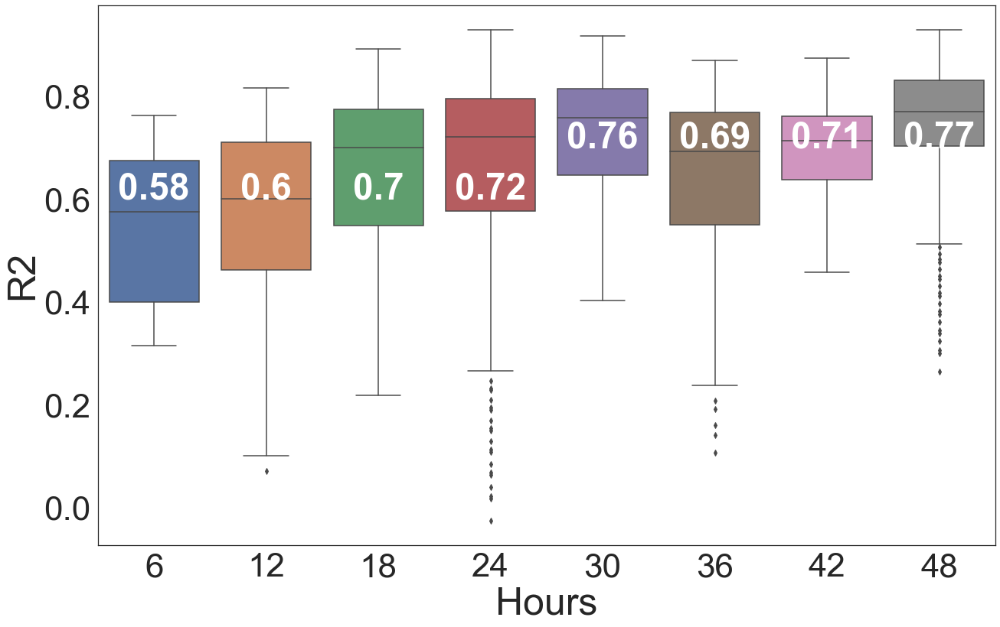

In [62]:
import seaborn as sns
import matplotlib.pylab as plt

mL1 = []
mL1.append(np.round(df_new['6'].median(), decimals=2))
mL1.append(np.round(df_new['12'].median(), decimals=2))
mL1.append(np.round(df_new['18'].median(), decimals=2))
mL1.append(np.round(df_new['24'].median(), decimals=2))
mL1.append(np.round(df_new['30'].median(), decimals=2))
mL1.append(np.round(df_new['36'].median(), decimals=2))
mL1.append(np.round(df_new['42'].median(), decimals=2))
mL1.append(np.round(df_new['48'].median(), decimals=2))

sns.set(rc={'figure.figsize':(21,13)})
sns.set(font_scale = 4, style="white")
testPlot = sns.boxplot(data=df_new)

top = 0.6 #m1[ind+1]+1
for tick in range(len(mL1)):
    if tick > 3:
        top = 0.7  
    testPlot.text(tick, top, mL1[tick],  horizontalalignment='center',  color='w', weight='semibold')


testPlot.set_xlabel('Hours', fontsize=50)  
testPlot.set_ylabel('R2', fontsize=50)  

In [100]:
df_DDCRNN = pd.read_csv('R2_all/r2_94/R2_DCRNN.csv')
df_ARIMA = pd.read_csv('R2_all/r2_94/R2_ARIMA.csv')
df_LR = pd.read_csv('R2_all/r2_94/R2_LinearRegression.csv')
df_RM = pd.read_csv('R2_all/r2_94/R2_RandomForest.csv')
df_GB = pd.read_csv('R2_all/r2_94/R2_GradientBoosting.csv')
df_RNNNR = pd.read_csv('R2_all/r2_94/R2_SimpleRNN_NR.csv')
df_RNNR = pd.read_csv('R2_all/r2_94/R2_SimpleRNN_R.csv')
df_LSTMNR = pd.read_csv('R2_all/r2_94/R2_vanillaLSTM_NR.csv')
df_LSTMR = pd.read_csv('R2_all/r2_94/R2_vanillaLSTM_R.csv')
df_SLSTMNR = pd.read_csv('R2_all/r2_94/R2_stackedLSTM_NR.csv')
df_SLSTMR = pd.read_csv('R2_all/r2_94/R2_stackedLSTM_R.csv')
df_GRUNR = pd.read_csv('R2_all/r2_94/R2_GRU_NR.csv')
df_GRUR = pd.read_csv('R2_all/r2_94/R2_GRU_R.csv')
df_FIRETS = pd.read_csv('R2_all/r2_94/R2_fireTS.csv')

In [101]:
df_DDCRNN = df_DDCRNN.set_index('sites')
df_ARIMA = df_ARIMA.set_index('sites')
df_LR = df_LR.set_index('sites')
df_RM = df_RM.set_index('sites')
df_GB = df_GB.set_index('sites')
df_RNNNR = df_RNNNR.set_index('sites')
df_RNNR = df_RNNR.set_index('sites')
df_LSTMNR = df_LSTMNR.set_index('sites')
df_LSTMR = df_LSTMR.set_index('sites')
df_SLSTMNR = df_SLSTMNR.set_index('sites')
df_SLSTMR = df_SLSTMR.set_index('sites')
df_GRUNR = df_GRUNR.set_index('sites')
df_GRUR = df_GRUR.set_index('sites')
df_FIRETS = df_FIRETS.set_index('sites')

In [87]:
df_new = pd.DataFrame()
df_new['DDCRNN'] = df_DDCRNN.values.flatten()
df_new['ARIMA'] = df_ARIMA.values.flatten()
df_new['LR'] = df_LR.values.flatten()
df_new['RM'] = df_RM.values.flatten()
df_new['GB'] = df_GB.values.flatten()
df_new['RNNNR'] = df_RNNNR.values.flatten()
df_new['RNNR'] = df_RNNR.values.flatten()
df_new['LSTMNR'] = df_LSTMNR.values.flatten()
df_new['LSTMR'] = df_LSTMR.values.flatten()
df_new['SLSTMNR'] = df_SLSTMNR.values.flatten()
df_new['SLSTMR'] = df_SLSTMR.values.flatten()
df_new['GRUNR'] = df_GRUNR.values.flatten()
df_new['GRUR'] = df_GRUR.values.flatten()
df_new['FIRETS'] = df_FIRETS.values.flatten()

Text(0, 0.5, 'R2')

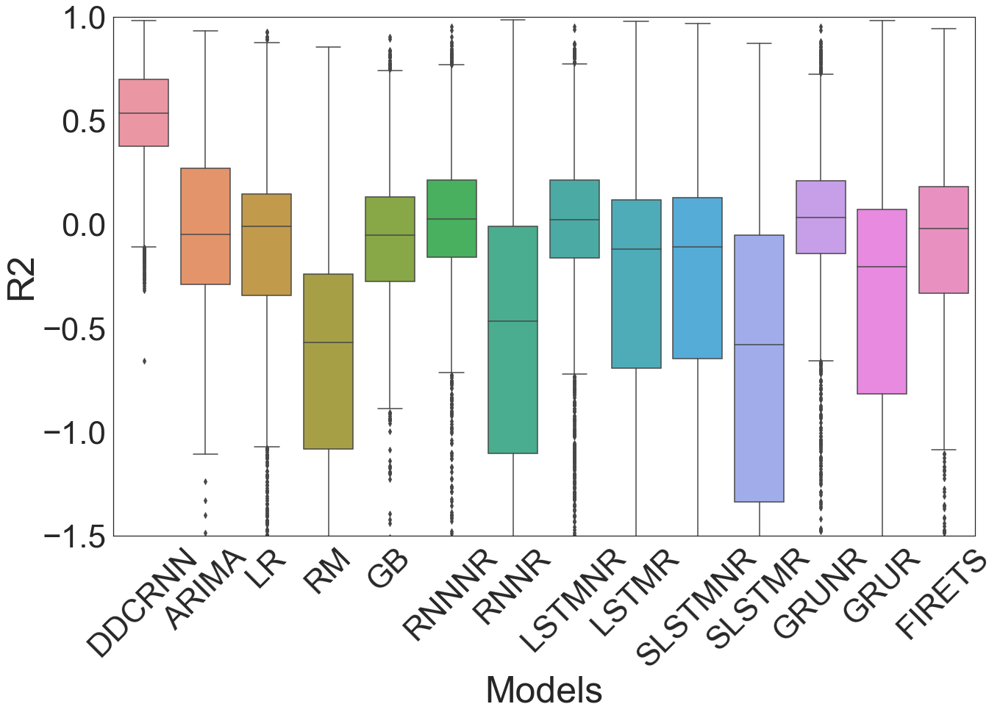

In [96]:
import seaborn as sns
import matplotlib.pylab as plt


sns.set(rc={'figure.figsize':(21,13)})
sns.set(font_scale = 4, style="white")
testPlot = sns.boxplot(data=df_new)
testPlot.set(ylim=(-1.5, 1))
testPlot.set_xticklabels(testPlot.get_xticklabels(), rotation=45)

testPlot.set_xlabel('Models', fontsize=50 )  
testPlot.set_ylabel('R2', fontsize=50)  

/Users/tanwimallick/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/tanwimallick/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/tanwimallick/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control

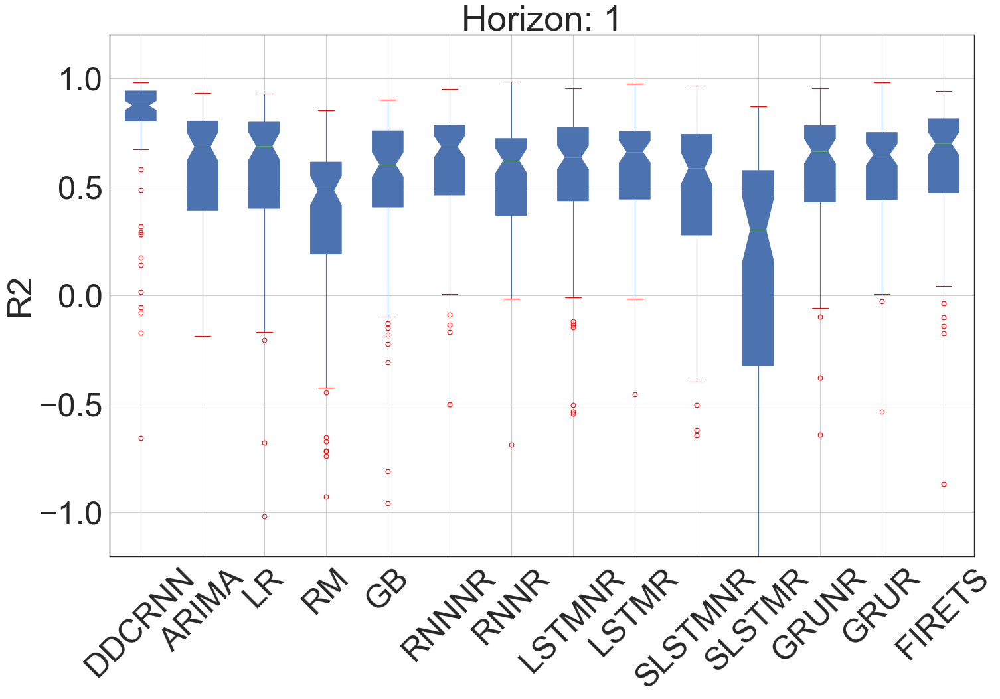

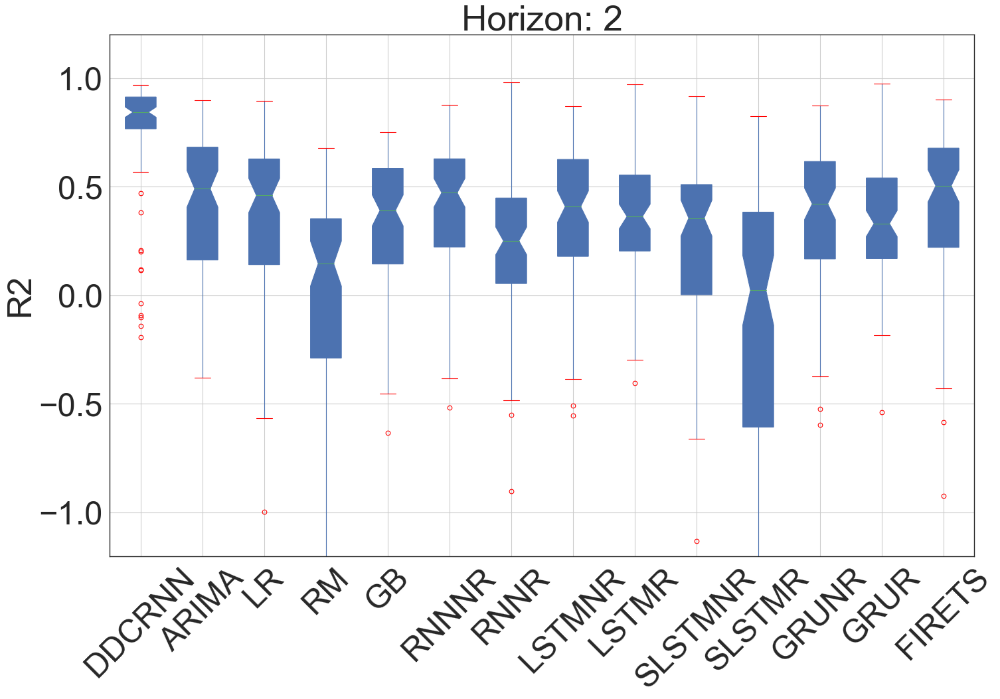

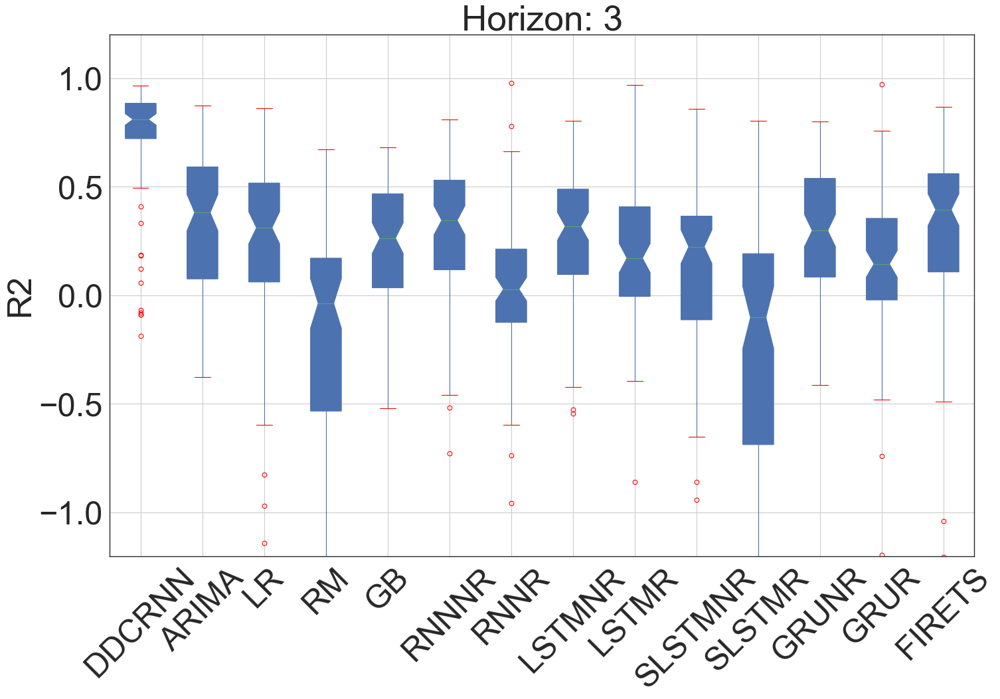

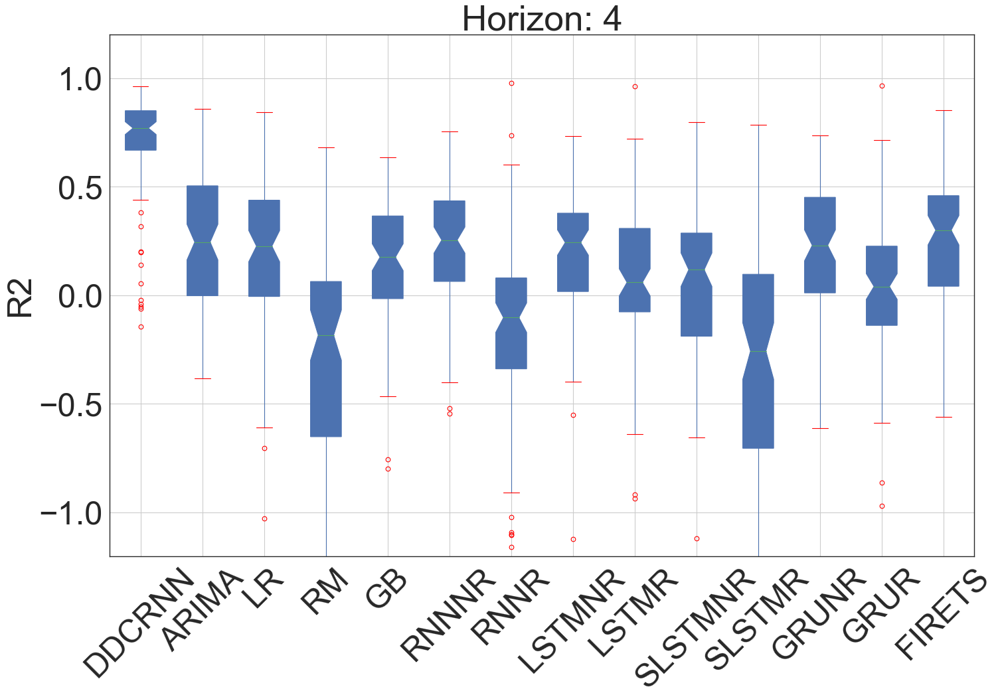

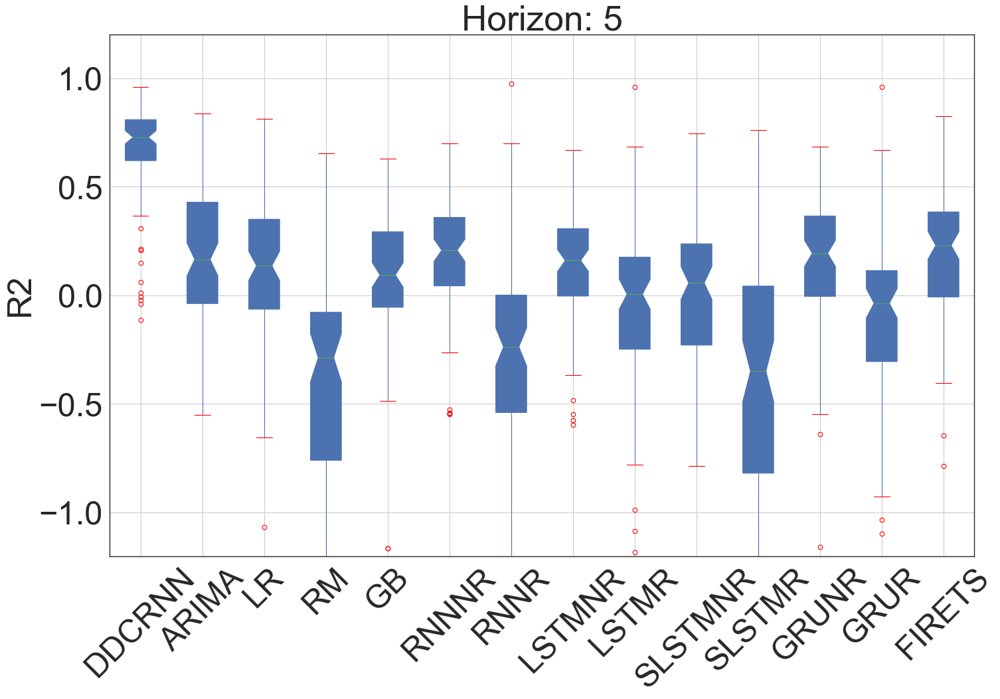

...

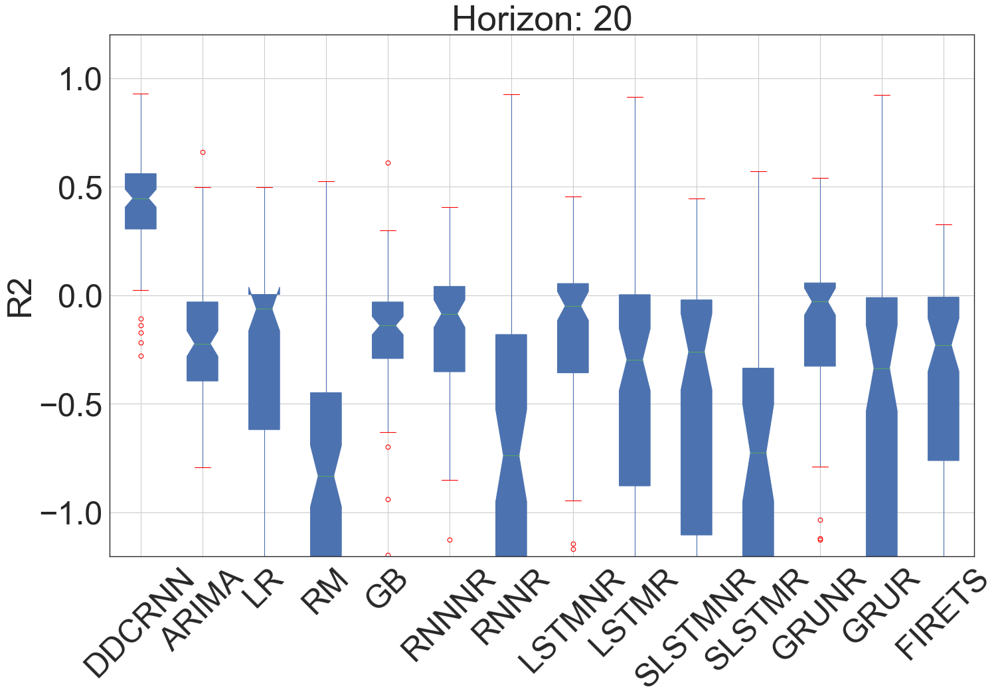

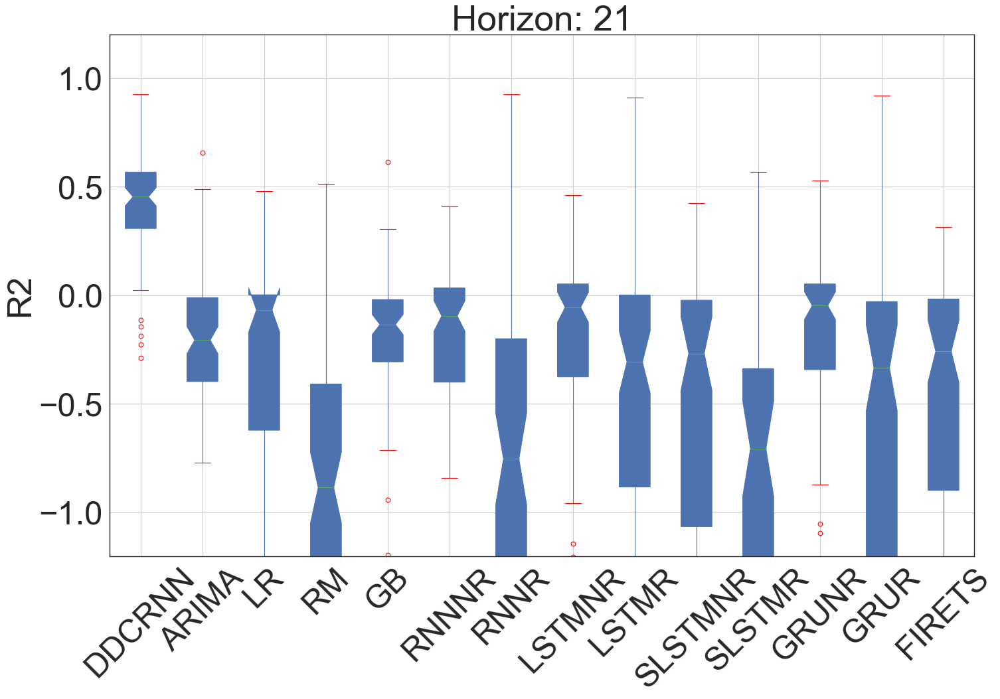

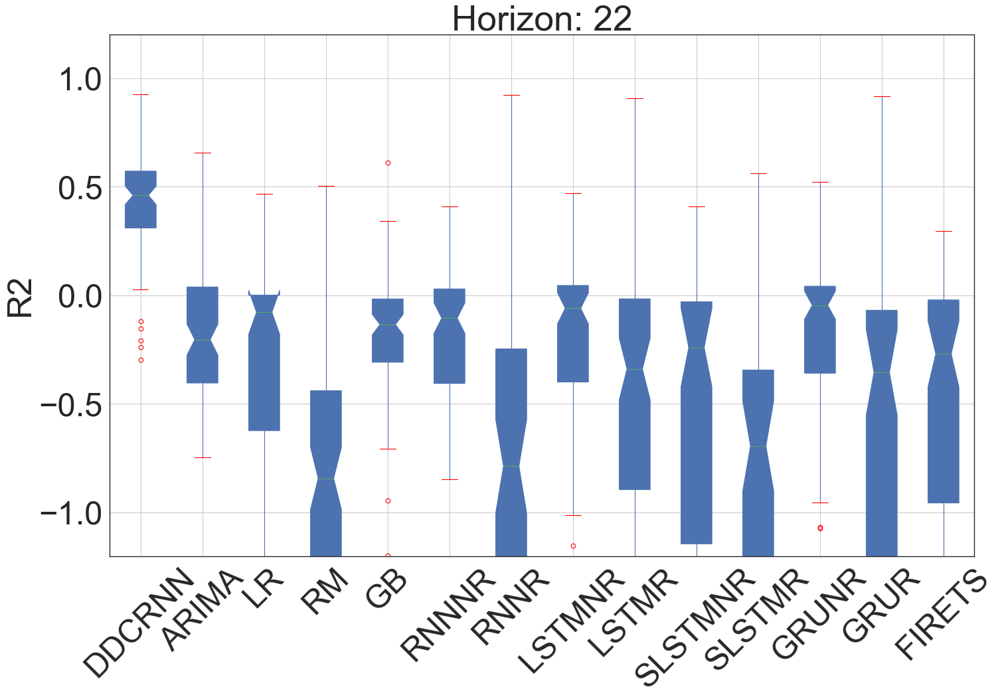

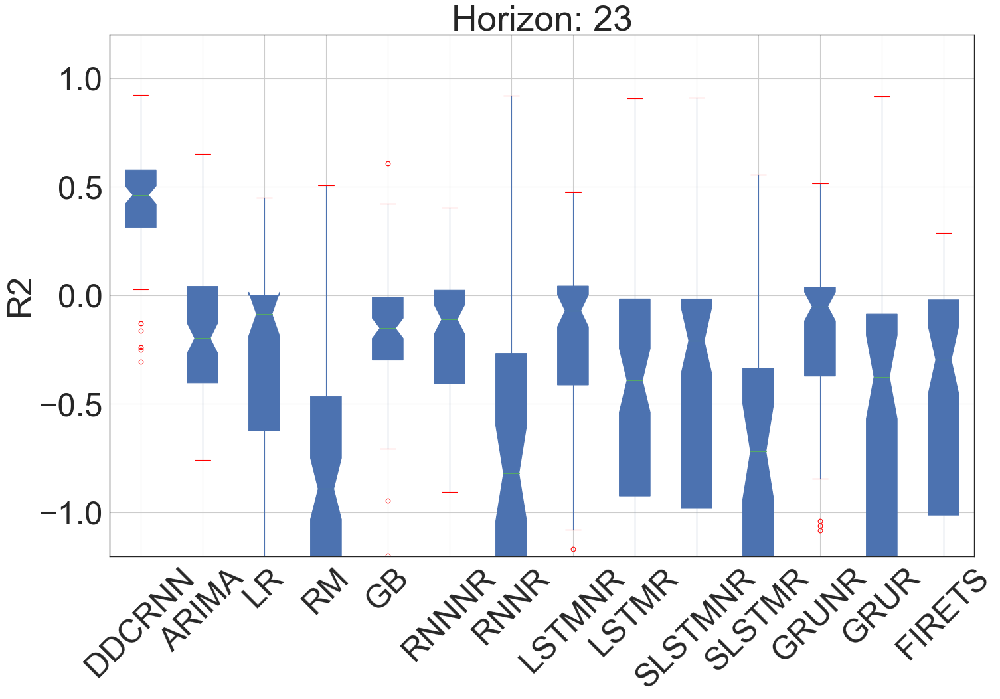

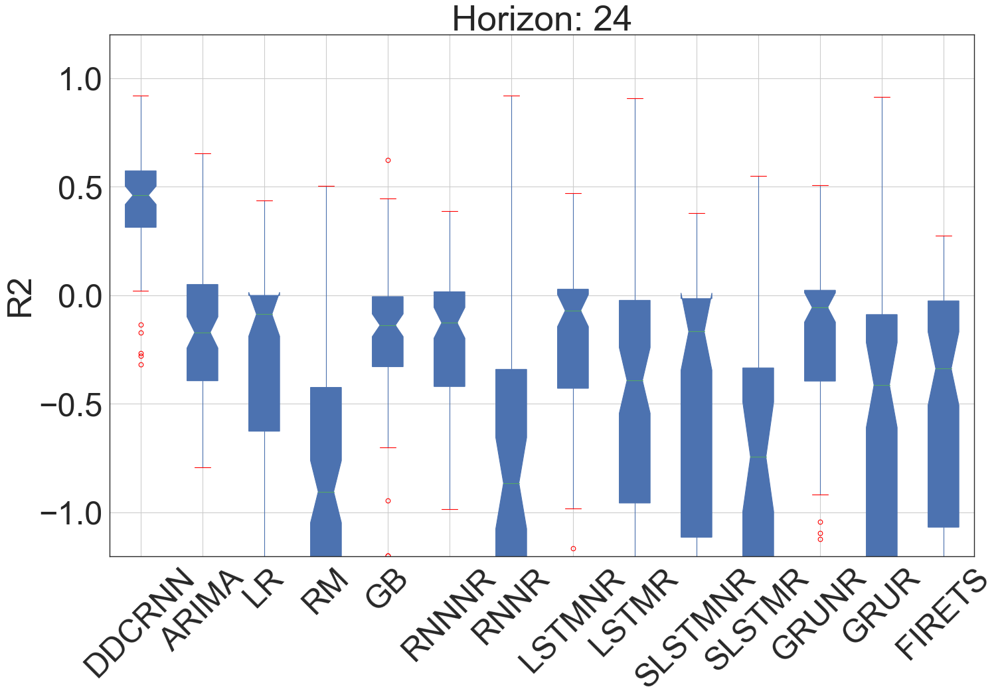

In [120]:
for horizon in range(24):
    df_hor = pd.DataFrame()
    
    df_hor['DDCRNN'] = df_DDCRNN.iloc[:, horizon]
    df_hor['ARIMA'] = df_ARIMA.iloc[:, horizon]
    df_hor['LR'] = df_LR.iloc[:, horizon]
    df_hor['RM'] = df_RM.iloc[:, horizon]
    df_hor['GB'] = df_GB.iloc[:, horizon]
    df_hor['RNNNR'] = df_RNNNR.iloc[:, horizon]
    df_hor['RNNR'] = df_RNNR.iloc[:, horizon]
    df_hor['LSTMNR'] = df_LSTMNR.iloc[:, horizon]
    df_hor['LSTMR'] = df_LSTMR.iloc[:, horizon]
    df_hor['SLSTMNR'] = df_SLSTMNR.iloc[:, horizon]
    df_hor['SLSTMR'] = df_SLSTMR.iloc[:, horizon]
    df_hor['GRUNR'] = df_GRUNR.iloc[:, horizon]
    df_hor['GRUR'] = df_GRUR.iloc[:, horizon]
    df_hor['FIRETS'] = df_FIRETS.iloc[:, horizon]
    
    plt.figure(figsize=(21, 13), dpi= 80, facecolor='w', edgecolor='k')
    c = 'red'
    df_hor.boxplot(notch=True, patch_artist=True,
            boxprops=dict(facecolor=c, color=c),
            capprops=dict(color=c),
            whiskerprops=dict(color=c),
            flierprops=dict(color=c, markeredgecolor=c),
            medianprops=dict(color=c))
    plt.ylim(-1.2, 1.2)
    plt.xticks(rotation=45)
    plt.ylabel('R2', fontsize=45) 
    plt.title('Horizon: %d'%(horizon+1))